# packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import sys
import os
# sys.path.insert(0, os.path.abspath('src/'))
import src.analysis_utils as au

In [3]:
from more_itertools import consecutive_groups

In [4]:
def compute_hmean(df,rank):
    df_t = df.copy(deep=True)
    df_t = df_t.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).mean()
    df_t['hmean'] = (3 * (df_t['iou'] * (df_t['count']/195)*(df_t['most_consecutive_frames']/df_t['count']))) / ((df_t['iou'] *(df_t['count']/195))+((df_t['count']/195)*(df_t['most_consecutive_frames']/df_t['count']))+(df_t['iou']*(df_t['most_consecutive_frames']/df_t['count'])))
    df_t['ranking'] = df_t['hmean'].rank(method='first',ascending=False)
    df_t = df_t.sort_values(by='ranking')
    df_t = df_t[df_t.ranking <= rank]
    return df_t

In [5]:
def get_most_consecutive_frames(df):
    consecutive_fams = [list(group) for group in consecutive_groups(df.frame.values)]
    l = [len(i) for i in consecutive_fams]
    return max(l)

In [6]:
def plot_heatmap2D(df,col,metric,column):
    fig,ax = plt.subplots(2,col,figsize=(30,10))
    
    if metric == 'mean':
        df_heat = df.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).mean()[column].unstack(level=2).copy(deep=True)
    elif metric == 'max':
        df_heat = df.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).max()[column].unstack(level=2).copy(deep=True)
    elif metric == 'median':
        df_heat = df.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).median()[column].unstack(level=2).copy(deep=True)
    
    counter = 0
    for l,i in enumerate(df_heat.columns):
        if column == 'count':
            sns.heatmap(df_heat[i].unstack(level=1),cmap='rocket_r',annot=True,vmin=0,ax=ax[l//col,counter])
        elif column == 'hmean':
            sns.heatmap(df_heat[i].unstack(level=1),cmap='rocket_r',annot=True,vmin=0,vmax=1,ax=ax[l//col,counter])
        else:
            sns.heatmap(df_heat[i].unstack(level=1),cmap='rocket_r',annot=True,vmin=0,vmax=1,ax=ax[l//col,counter])

        ax[l//col,counter].set_title(f'gap_closing_max_frame_count value : {i}')
        if counter == (col-1):
            counter = 0
        else:
            counter +=1

    fig.suptitle(f'Heatmap with computed {metric} {column} values',fontsize=20)
    fig.tight_layout()

In [7]:
def get_best_param(df_heat,metric,n_top):
    df_heat['param'] = df_heat['track_cost_cutoff'].astype(str) + '_' + df_50_g['gap_closing_cost_cutoff'].astype(str) + '_' + df_heat['gap_closing_max_frame_count'].astype(str)
    df_heat['ranking'] = df_heat[metric].rank(method='first',ascending=False)
    df_heat = df_heat.sort_values(by='ranking')

    # Get the n_top top parameters 

    best_params = [df_heat.iloc[0].param] #list of the best params

    for i in df_heat.iloc:
        if i.param not in best_params :
            best_params.append(i.param)
            if len(best_params) > n_top: # check that you only take n_top
                break                                                    

    df_best_params = pd.DataFrame()

    for l,i in enumerate(best_params):
        df = df_heat[df_heat.param == i].copy(deep=True)
        df.loc[:,'top'] = l+1
        df_best_params = pd.concat([df_best_params,df])

    df_best_params.reset_index(inplace=True,drop=True)
    df_best_params

    return df_best_params

## get best param

In [10]:
df_best = get_best_param(df_2,'iou',1)

In [11]:
df_best

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,param,ranking,top
0,52,108,52,2,1.000000,1.3,2.0,2,0,1.3_2.0_2,1.0,1
1,79,207,89,2,1.000000,1.3,2.0,2,0,1.3_2.0_2,2.0,1
2,82,217,97,2,1.000000,1.3,2.0,2,0,1.3_2.0_2,3.0,1
3,110,287,119,3,1.000000,1.3,2.0,2,0,1.3_2.0_2,4.0,1
4,114,299,125,3,1.000000,1.3,2.0,2,0,1.3_2.0_2,5.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
331,118,320,210,3,0.016129,2.0,2.0,2,0,2.0_2.0_2,8492.0,2
332,141,380,208,1,0.016129,2.0,2.0,2,0,2.0_2.0_2,8493.0,2
333,109,303,137,2,0.012121,2.0,2.0,2,0,2.0_2.0_2,8844.0,2
334,93,260,137,2,0.012048,2.0,2.0,2,0,2.0_2.0_2,8975.0,2


## finer search

In [39]:
df_2_fine = pd.read_csv("/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/benchmarking/finer/evaluation/combined/combined_results.csv")

In [40]:
df_2_fine

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq
0,0,2,210,7,0.037838,1.7,3.0,1,0
1,1,3,2,6,0.250000,1.7,3.0,1,0
2,2,4,3,15,0.110294,1.7,3.0,1,0
3,3,5,5,3,0.075000,1.7,3.0,1,0
4,4,6,137,3,0.018182,1.7,3.0,1,0
...,...,...,...,...,...,...,...,...,...
16487,137,312,192,2,1.000000,2.0,4.0,2,0
16488,138,316,215,2,0.117647,2.0,4.0,2,0
16489,139,318,210,6,0.032432,2.0,4.0,2,0
16490,140,321,215,3,0.176471,2.0,4.0,2,0


In [41]:
df_best_fine = get_best_param(df_2_fine,'iou',10)

<AxesSubplot: ylabel='Frequency'>

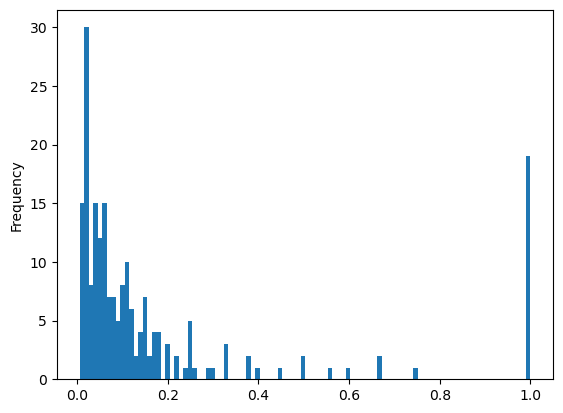

In [42]:
df_best_fine[df_best_fine.top == 1].iou.plot(kind='hist', bins=100)

In [43]:
df = df_2_fine
df['param'] = df['track_cost_cutoff'].astype(str) + '_' + df['gap_closing_cost_cutoff'].astype(str) + '_' + df['gap_closing_max_frame_count'].astype(str)

In [44]:
df = df.groupby('param').mean()
df

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,ranking
param,,,,,,,,,,
1.0_2.0_0,111.5,409.602679,115.165179,3.575893,0.122453,1.0,2.0,0.0,0.0,10359.674107
1.0_2.0_1,105.0,301.000000,113.729858,4.649289,0.188845,1.0,2.0,1.0,0.0,8475.592417
1.0_2.0_2,88.0,220.135593,113.316384,5.949153,0.194435,1.0,2.0,2.0,0.0,7590.570621
1.0_2.5_0,111.5,409.602679,115.165179,3.575893,0.122453,1.0,2.5,0.0,0.0,10436.968750
1.0_2.5_1,106.0,276.131455,112.901408,4.755869,0.195200,1.0,2.5,1.0,0.0,8345.596244
...,...,...,...,...,...,...,...,...,...,...
2.0_3.0_1,103.5,261.552885,114.725962,4.947115,0.191910,2.0,3.0,1.0,0.0,8223.091346
2.0_3.0_2,71.5,175.875000,115.937500,7.548611,0.238764,2.0,3.0,2.0,0.0,6229.777778
2.0_4.0_0,104.0,292.444976,114.253589,4.760766,0.194618,2.0,4.0,0.0,0.0,8167.755981


<AxesSubplot: xlabel='top', ylabel='iou'>

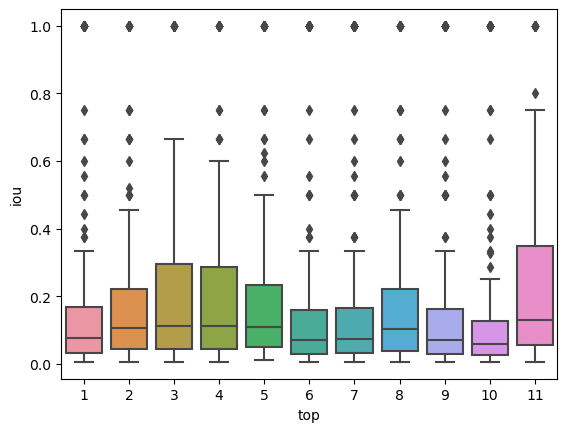

In [45]:
sns.boxplot(x='top',y='iou',data=df_best_fine)

In [36]:
df = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/test/real_frame/evaluation/combined/combined_results.csv')

In [37]:
df

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq
0,0,2,210,7,0.037838,2.0,0.0,0,0
1,1,3,2,6,0.250000,2.0,0.0,0,0
2,2,4,3,15,0.110294,2.0,0.0,0,0
3,3,5,5,3,0.075000,2.0,0.0,0,0
4,4,6,137,3,0.018182,2.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...
204,204,572,137,2,0.012121,2.0,0.0,0,0
205,205,574,75,8,0.076190,2.0,0.0,0,0
206,206,575,210,4,0.021622,2.0,0.0,0,0
207,207,578,215,2,0.117647,2.0,0.0,0,0


## get track param

In [156]:
import os
import nums_from_string as nfs
def get_tracks_params(path):
    list_df = pd.DataFrame()
    for i in os.listdir(path):
        if 'track_cost' in i:
            tracks = pd.read_csv(path+i)
            avg_track_len = np.max([len(tracks[tracks.track_id==i]) for i in tracks.track_id.unique()])
            # print(max([len(tracks[tracks.track_id==i]) for i in tracks.track_id.unique()]))
            track_number = len(tracks.track_id.unique())
            track_df = pd.DataFrame(columns=['track_number','avg track length','param'])
            track_df['track_number'] = [track_number]
            track_df['avg track length'] = [avg_track_len]
            track_df['param'] = str(nfs.get_nums(i))
            list_df = pd.concat([list_df,track_df])
        else:
            continue
    
    return list_df

In [157]:
df_param = get_tracks_params('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/75pM/dt_2/filtered_tracks/')

In [158]:
df_param.head()

,track_number,avg track length,param
0,271,36,"[2.0, 6.0, 0, 0]"
0,161,153,"[3.0, 5.0, 4, 0]"
0,125,119,"[2.0, 7.0, 4, 0]"
0,186,119,"[4.0, 8.0, 2, 0]"
0,215,91,"[5.0, 5.0, 2, 0]"


In [30]:
df_param[df_param.param == '[2.0, 5.0, 3, 0]']

,track_number,avg track length,param
0,122,10.606557,"[2.0, 5.0, 3, 0]"


## get gaps

In [21]:
def get_gaps(df:pd.DataFrame) -> pd.DataFrame:
    """
    :param df: track dataframe
    :return: a pandas dataframe with gaps per track id
    """
    df = df.reset_index()
    df = df[['x','y','frame','track_id']]
    df['frame'] = df['frame'].astype(int)
    df = df.sort_values(by=['track_id','frame'])
    df['frame_diff'] = df['frame'].diff()
    df['frame_diff'] = df['frame_diff'].fillna(0)
    df['frame_diff'] = df['frame_diff'].astype(int)
    df['gaps'] = 0
    df.loc[df['frame_diff'] > 1,'gaps'] = df['frame_diff'] - 1
    df = df.drop(columns=['frame_diff'])
    return df

In [ ]:
df_comb = pd.DataFrame()
for i in os.listdir('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/large_sweep/'):
    if 'track_cost_cutoff_2.0_gap_closing_cost_cutoff_5.0_gap_closing_max_frame_count_3' in i:
        tracks = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/large_sweep/'+i)
        tracks = get_gaps(tracks)

    

In [ ]:
df_f = tracks.groupby(['track_id']).size()


df_d = tracks.groupby(['track_id']).sum()

df_d['count'] = df_f.values
df_d = df_d[['gaps','count']]
df_d


In [ ]:
df_d[df_d.gaps == max(df_d.gaps)]

## finer sweep

In [3]:
df_fine = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/finer_sweep/evaluation/combined/combined_results.csv')

In [4]:
df_fine_best = au.get_best_param(df_fine,'count',10)

In [6]:
df_fine_best

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,param,ranking,top
0,16,16,137,152,0.835165,2.0,5.0,3,0,2.0_5.0_3,1.0,1
1,36,44,218,62,0.539130,2.0,5.0,3,0,2.0_5.0_3,716.0,1
2,65,104,210,55,0.292553,2.0,5.0,3,0,2.0_5.0_3,1014.0,1
3,4,4,3,42,0.308824,2.0,5.0,3,0,2.0_5.0_3,1757.0,1
4,28,31,210,42,0.222222,2.0,5.0,3,0,2.0_5.0_3,1758.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1391,67,101,1,1,0.033333,1.7,4.5,4,0,1.7_4.5_4,79032.0,11
1392,69,106,0,1,0.043478,1.7,4.5,4,0,1.7_4.5_4,79033.0,11
1393,71,106,216,1,0.142857,1.7,4.5,4,0,1.7_4.5_4,79034.0,11
1394,91,147,221,1,0.200000,1.7,4.5,4,0,1.7_4.5_4,79035.0,11


In [29]:
df_fine_best.gap_closing_max_frame_count.unique()

array([3, 4])

In [7]:
tracks_param = au.get_tracks_params('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/finer_sweep/')

In [8]:
tracks_param

,track_number,avg track length,param
0,203,5.216749,"[2.5, 0.0, 0, 0]"
0,186,6.037634,"[1.8, 4.0, 1, 0]"
0,200,5.065000,"[2.0, 6.0, 0, 0]"
0,204,4.867647,"[1.7, 4.5, 0, 0]"
0,115,11.478261,"[3.0, 5.0, 4, 0]"
...,...,...,...
0,133,9.481203,"[1.2, 5.5, 2, 0]"
0,209,4.641148,"[1.5, 0.0, 2, 0]"
0,135,9.244444,"[1.8, 5.0, 2, 0]"
0,92,14.956522,"[2.0, 7.0, 5, 0]"


In [9]:
tracks_param_best = tracks_param[tracks_param.param == '[2.0, 5.0, 3, 0]'] 

In [10]:
tracks_param_best

,track_number,avg track length,param
0,122,10.606557,"[2.0, 5.0, 3, 0]"


In [12]:
df_comb = pd.DataFrame()
for i in os.listdir('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/finer_sweep/'):
    if 'track_cost_cutoff_2.0_gap_closing_cost_cutoff_5.0_gap_closing_max_frame_count_3' in i:
        tracks = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/large_sweep/'+i)
        tracks = au.get_gaps(tracks)


In [13]:
df_f = tracks.groupby(['track_id']).size()


df_d = tracks.groupby(['track_id']).sum()

df_d['count'] = df_f.values
df_d = df_d[['gaps','count']]
df_d


,gaps,count
track_id,,
0,3,5
2,4,20
3,5,15
4,2,42
5,3,6
...,...,...
208,7,22
212,0,4
216,5,2


In [14]:
df_d[df_d['count'] == max(df_d['count'])]

,gaps,count
track_id,,
16,20,169


In [17]:
df_d['gap_ratio'] = df_d['gaps']/df_d['count']
df_d

,gaps,count,gap_ratio
track_id,,,
0,3,5,0.600000
2,4,20,0.200000
3,5,15,0.333333
4,2,42,0.047619
5,3,6,0.500000
...,...,...,...
208,7,22,0.318182
212,0,4,0.000000
216,5,2,2.500000


In [18]:
df_d[df_d['count'] == max(df_d['count'])]

,gaps,count,gap_ratio
track_id,,,
16,20,169,0.118343


In [19]:
df_be = tracks[tracks.track_id == 16]

In [20]:
df_be

,x,y,frame,track_id,gaps
38,8.294664,19.614397,4,16,0
47,9.279477,19.082697,5,16,0
57,10.508765,19.609271,6,16,0
75,7.689914,20.258690,8,16,1
90,7.620334,19.386046,9,16,0
...,...,...,...,...,...
1251,6.596938,16.023255,187,16,0
1254,6.309858,15.626765,188,16,0
1258,6.857201,16.781905,189,16,0
1263,7.274827,16.274713,191,16,1


Text(0, 0.5, 'gap count')

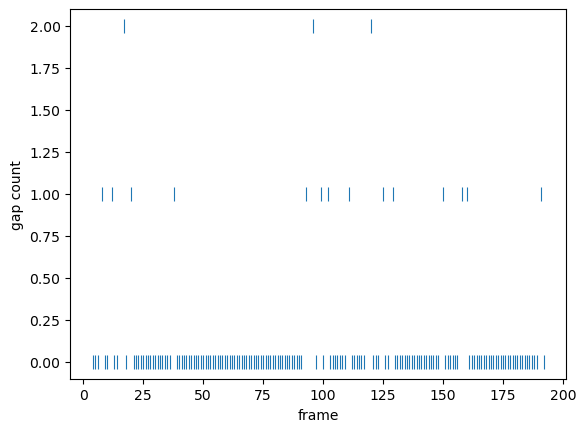

In [35]:
sns.scatterplot(x='frame',y='gaps',data=df_be,marker='|',s=100)
# plt.xscale('log')
# count = 0
# for l,i in enumerate(df_be.gaps):
#     if i > 0:
#         count+= 1 
#         plt.vlines(df_be[df_be.gaps == i].frame.values,0,2,linestyles='dashed',alpha=0.01)

plt.ylabel('gap count')

(0.0, 35.0)

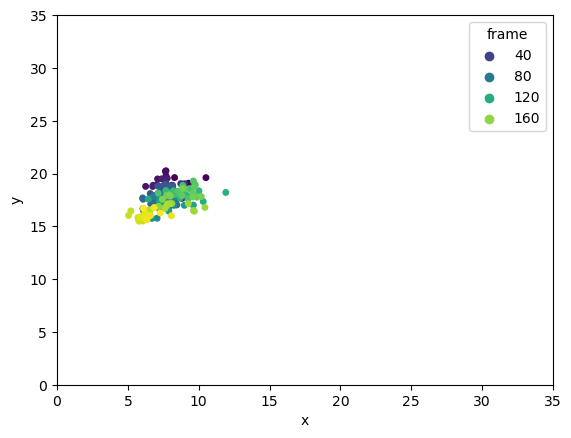

In [40]:
sns.scatterplot(x='x',y='y',data=df_be,marker='.',s=100,hue='frame',palette='viridis',linewidth=0)
plt.xlim(0,35)
plt.ylim(0,35)

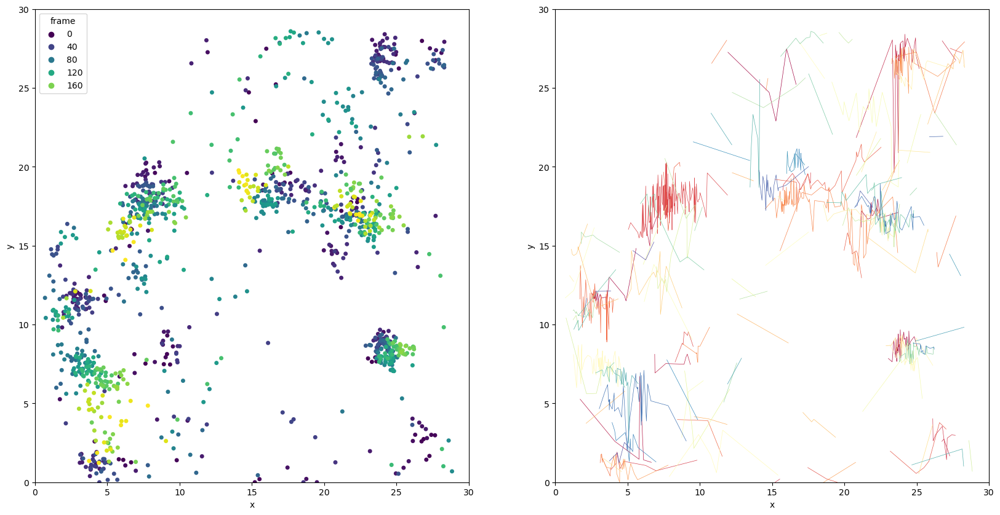

In [60]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
sns.scatterplot(x='x',y='y',data=tracks,marker='.',s=100,hue='frame',palette='viridis',linewidth=0,ax=ax[0])
sns.lineplot(x='x',y='y',data=tracks,hue='track_id',ax=ax[1],legend=False,palette=sns.color_palette('Spectral', len(tracks.track_id.unique())),linewidth=0.5)

for a in ax:
    a.set_xlim(0,30)
    a.set_ylim(0,30)


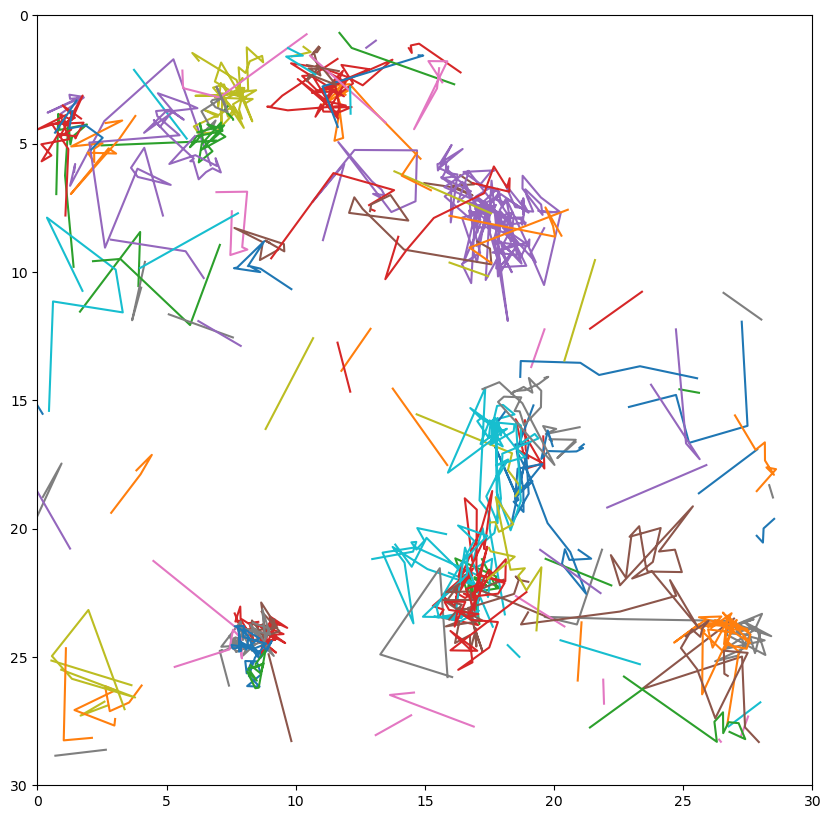

In [71]:
plt.figure(figsize=(10,10))

for i in tracks.track_id.unique():
    df_bep = tracks[tracks.track_id == i]
    # print(df_bep)
    # break
    plt.plot(df_bep.y.values,df_bep.x.values)
plt.xlim(0,30)
plt.ylim(30,0)
plt.show()

In [22]:
tracks_100pM = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/tracking/ground_truth/100pM/tracks_100pM.csv')

In [30]:
tracks_100pM_g = tracks_100pM.groupby(['TRACK_ID']).size()
tracks_100pM_g = tracks_100pM_g[tracks_100pM_g > 10]
tracks_100pM_g = tracks_100pM_g.reset_index()
tracks_100pM_g.columns = ['TRACK_ID','count']
tracks_100pM_g

,TRACK_ID,count
0,0,18
1,1,27
2,100,21
3,117,20
4,137,165
5,162,42
6,2,24
7,20,11
8,208,52
9,210,185


# 50 pM

In [84]:
df_50 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/wide_sweep/evaluation/combined/combined_results.csv')

In [85]:
df_50_best = au.get_best_param(df_50,'count',10)

In [86]:
df_50_best

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,param,ranking,top
0,14,11,5,89,0.465969,1.5,7.0,3,0,1.5_7.0_3,1.0,1
1,97,185,5,39,0.219101,1.5,7.0,3,0,1.5_7.0_3,425.0,1
2,63,92,14,23,0.261364,1.5,7.0,3,0,1.5_7.0_3,1662.0,1
3,2,2,12,12,0.300000,1.5,7.0,3,0,1.5_7.0_3,5507.0,1
4,90,155,5,12,0.064516,1.5,7.0,3,0,1.5_7.0_3,5508.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1141,91,206,10,1,0.018868,1.0,5.5,3,0,1.0_5.5_3,89557.0,11
1142,97,246,5,1,0.005495,1.0,5.5,3,0,1.0_5.5_3,89558.0,11
1143,101,259,19,1,0.023256,1.0,5.5,3,0,1.0_5.5_3,89559.0,11
1144,102,265,5,1,0.005650,1.0,5.5,3,0,1.0_5.5_3,89560.0,11


In [87]:
df_50

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,param,ranking
0,0,0,1,3,0.750000,2.5,0.0,0,0,2.5_0.0_0,31571.0
1,1,2,12,3,0.081081,2.5,0.0,0,0,2.5_0.0_0,31572.0
2,2,4,20,3,0.250000,2.5,0.0,0,0,2.5_0.0_0,31573.0
3,3,5,0,2,0.400000,2.5,0.0,0,0,2.5_0.0_0,45316.0
4,4,8,29,2,0.090909,2.5,0.0,0,0,2.5_0.0_0,45317.0
...,...,...,...,...,...,...,...,...,...,...,...
93441,116,365,19,2,0.047619,5.0,2.0,5,0,5.0_2.0_5,72151.0
93442,117,367,10,2,0.045455,5.0,2.0,5,0,5.0_2.0_5,72152.0
93443,118,372,14,2,0.023810,5.0,2.0,5,0,5.0_2.0_5,72153.0
93444,119,373,10,5,0.113636,5.0,2.0,5,0,5.0_2.0_5,23716.0


In [83]:
for i in [1.0,2.0,3.0]:
    print(len(df_50[(df_50.track_cost_cutoff == i) & (df_50.gap_closing_cost_cutoff == 2.0) & (df_50.gap_closing_max_frame_count == 5)]))

100
95
105


In [93]:
df_50_g = df_50.copy()
df_50_g['param'] = df_50_g['track_cost_cutoff'].astype(str) + '_' + df_50_g['gap_closing_cost_cutoff'].astype(str) + '_' + df_50_g['gap_closing_max_frame_count'].astype(str)
df_50_g = df_50_g.groupby(['param']).mean()

In [94]:
df_50_g

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,ranking
param,,,,,,,,,,
1.0_0.0_0,38.5,592.217949,9.564103,2.487179,0.043533,1.0,0.0,0.0,0.0,50903.179487
1.0_0.0_1,38.5,592.217949,9.564103,2.487179,0.043533,1.0,0.0,1.0,0.0,59836.846154
1.0_0.0_2,38.5,592.217949,9.564103,2.487179,0.043533,1.0,0.0,2.0,0.0,47320.987179
1.0_0.0_3,38.5,592.217949,9.564103,2.487179,0.043533,1.0,0.0,3.0,0.0,57369.743590
1.0_0.0_4,38.5,592.217949,9.564103,2.487179,0.043533,1.0,0.0,4.0,0.0,56185.051282
...,...,...,...,...,...,...,...,...,...,...
6.0_9.0_2,71.0,98.643357,14.377622,3.643357,0.076692,6.0,9.0,2.0,0.0,51905.496503
6.0_9.0_3,62.0,74.152000,14.072000,4.264000,0.086835,6.0,9.0,3.0,0.0,45919.344000
6.0_9.0_4,57.5,54.163793,14.655172,4.637931,0.084659,6.0,9.0,4.0,0.0,51035.646552


In [91]:
df_50_g['rank'] = df_50_g['iou'].rank(method='first',ascending=False)
df_50_g = df_50_g.sort_values(by='rank')
df_50_g

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,ranking,rank
param,,,,,,,,,,,
1.0_5.0_5,39.5,42.0,14.0,3.0,0.109127,1.0,5.0,5.0,0.0,37496.5,1.0
3.0_5.5_5,42.0,64.0,12.0,3.0,0.108696,3.0,5.5,5.0,0.0,37658.0,2.0
3.0_5.0_5,42.5,67.5,13.0,3.0,0.108402,3.0,5.0,5.0,0.0,39199.5,3.0
2.2_4.5_5,43.0,67.0,14.0,3.0,0.102273,2.2,4.5,5.0,0.0,38364.0,4.0
1.2_5.5_6,39.0,28.0,14.0,2.0,0.101449,1.2,5.5,6.0,0.0,52470.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...
1.0_5.5_0,38.5,604.5,5.0,2.0,0.017045,1.0,5.5,0.0,0.0,62333.5,836.0
1.0_6.0_0,38.5,604.5,5.0,2.0,0.017045,1.0,6.0,0.0,0.0,71777.5,837.0
1.0_7.0_0,38.5,604.5,5.0,2.0,0.017045,1.0,7.0,0.0,0.0,56127.5,838.0


In [76]:
print(len(df_50_g[df_50_g.track_cost_cutoff == 1]))
print(len(df_50_g[df_50_g.track_cost_cutoff == 2]))
print(len(df_50_g[df_50_g.track_cost_cutoff == 3]))


56
56
56


<AxesSubplot: ylabel='Frequency'>

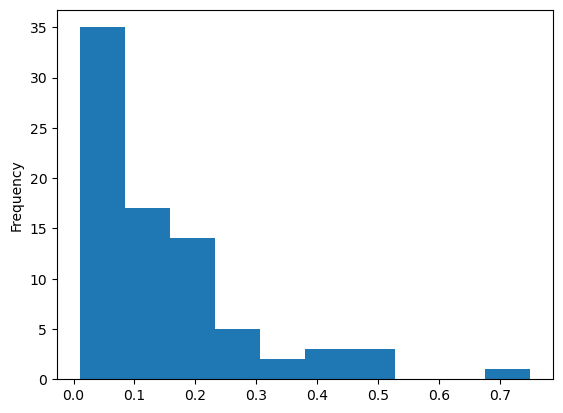

In [92]:
df_50[(df_50.track_cost_cutoff == 1.0) & (df_50.gap_closing_cost_cutoff == 5.0) & (df_50.gap_closing_max_frame_count == 5)].iou.plot(kind='hist')

In [67]:
df_50[(df_50.track_cost_cutoff == 1.0) & (df_50.gap_closing_cost_cutoff == 5.0) & (df_50.gap_closing_max_frame_count == 5)]

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq
23083,0,0,1,3,0.500000,1.0,5.0,5,0
23084,1,0,29,2,0.080000,1.0,5.0,5,0
23085,2,2,0,1,0.058824,1.0,5.0,5,0
23086,3,2,12,7,0.162791,1.0,5.0,5,0
23087,4,3,16,2,0.250000,1.0,5.0,5,0
...,...,...,...,...,...,...,...,...,...
23158,75,191,5,13,0.071429,1.0,5.0,5,0
23159,76,191,10,4,0.067797,1.0,5.0,5,0
23160,77,202,19,1,0.023256,1.0,5.0,5,0
23161,78,209,19,2,0.047619,1.0,5.0,5,0


In [35]:
tracks_param = au.get_tracks_params('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/wide_sweep/')

In [36]:
tracks_param

,track_number,avg track length,param
0,248,3.423387,"[2.5, 0.0, 0, 0]"
0,260,3.826923,"[1.8, 4.0, 1, 0]"
0,232,3.310345,"[2.0, 6.0, 0, 0]"
0,232,3.086207,"[1.7, 4.5, 0, 0]"
0,161,7.863354,"[3.0, 5.0, 4, 0]"
...,...,...,...
0,196,6.147959,"[1.2, 5.5, 2, 0]"
0,217,2.958525,"[1.5, 0.0, 2, 0]"
0,203,5.822660,"[1.8, 5.0, 2, 0]"
0,106,12.622642,"[2.0, 7.0, 5, 0]"


In [38]:
tracks_param_best = tracks_param[tracks_param.param == '[1.5, 7.0, 3, 0]']

In [40]:
tracks_param_best

,track_number,avg track length,param
0,151,8.655629,"[1.5, 7.0, 3, 0]"


In [110]:
tracks_50pM = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/tracking/ground_truth/50pM/tracks_50pM.csv')

In [109]:
tracks_50pM

TRACK_ID
0             5
1             4
10           44
11            4
12           37
14           84
16            8
19           42
20           12
23            6
26            2
29           22
30           44
4             3
5           176
8            51
Track ID      2
dtype: int64

In [111]:
tracks_50pM_g = tracks_50pM.groupby(['TRACK_ID']).size()

tracks_50pM_g = tracks_50pM_g[tracks_50pM_g > 10]
tracks_50pM_g = tracks_50pM_g.reset_index()
tracks_50pM_g.columns = ['TRACK_ID','count']
tracks_50pM_g

,TRACK_ID,count
0,10,44
1,12,37
2,14,84
3,19,42
4,20,12
5,29,22
6,30,44
7,5,176
8,8,51


In [112]:
tracks_50_filtered = tracks_50pM[tracks_50pM.TRACK_ID.isin(tracks_50pM_g.TRACK_ID)]

In [114]:
tracks_50_filtered.to_csv('/tungstenfs/scratch/ggiorget/nessim/tracking/ground_truth/50pM/tracks_50pM_filtered.csv',index=False)

In [47]:
tracks_50pM.TRACK_ID.unique()

array(['Track ID', nan, '0', '1', '4', '5', '8', '10', '11', '12', '14',
       '16', '19', '20', '23', '26', '29', '30'], dtype=object)

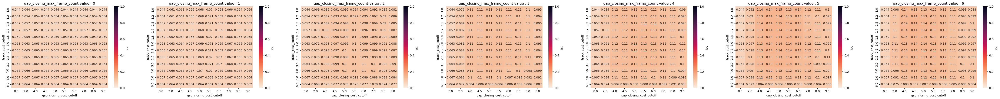

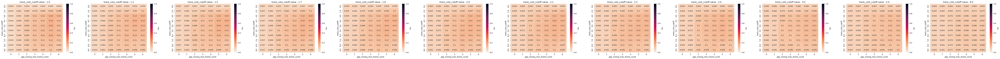

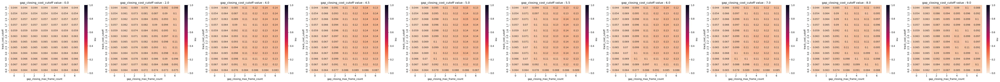

In [102]:
plot_heatmap2D(df_50,'iou')

# Long tracks

In [4]:
df_50_long = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/filtered_tracks/evaluation/combined/combined_results.csv')

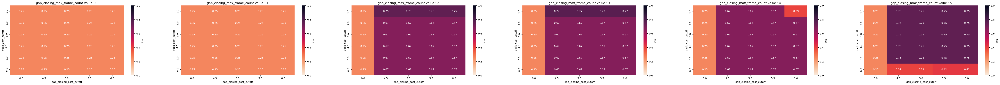

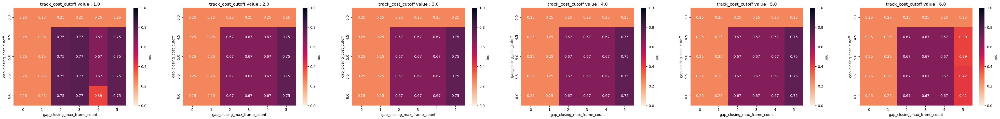

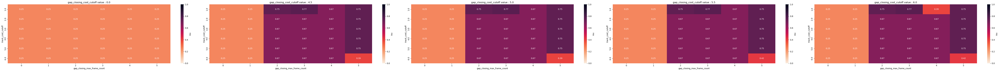

In [11]:
plot_heatmap2D(df_50_long,'iou')

# test change in code

In [3]:
df_test = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/test_lap_code/evaluation/combined/combined_results.csv')

In [15]:
df = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/test_lap_code/gt_50pM_seq_0.csv')

In [16]:
df.track_id.unique()

array([ 5,  8, 10, 12, 14, 19, 20, 29, 30])

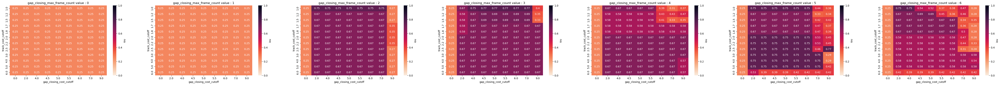

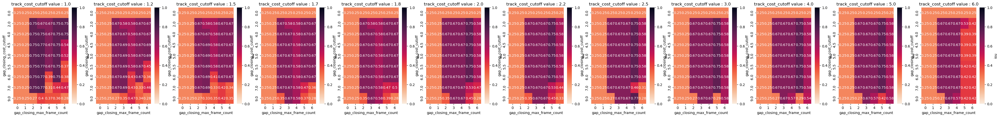

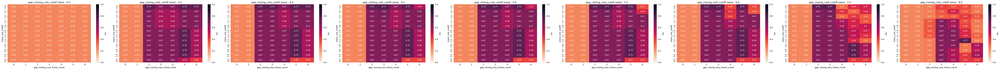

In [13]:
plot_heatmap2D(df_test,'iou')

In [18]:
tracks_param = au.get_tracks_params('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/test_lap_code//')

In [31]:
tracks_param[tracks_param.param == '[2.5, 9.0, 5, 0]']

,track_number,avg track length,param
0,86,15.813953,"[2.5, 9.0, 5, 0]"


In [72]:
tracks_param_test = tracks_param.copy(deep=True)

NameError: name 'tracks_param' is not defined

In [34]:
tracks_param_test.param.values[0]

'[2.5, 0.0, 0, 0]'

In [42]:
tracks_param

,track_number,avg track length,param
0,248,3.423387,"[2.5, 0.0, 0, 0]"
0,112,11.883929,"[5.0, 6.0, 6, 0]"
0,83,16.409639,"[2.2, 9.0, 5, 0]"
0,249,4.493976,"[6.0, 5.5, 1, 0]"
0,261,4.107280,"[5.0, 2.0, 0, 0]"
...,...,...,...
0,148,8.702703,"[6.0, 5.5, 4, 0]"
0,176,7.090909,"[6.0, 7.0, 2, 0]"
0,260,3.865385,"[4.0, 7.0, 0, 0]"
0,189,6.449735,"[3.0, 4.5, 3, 0]"


In [36]:
import nums_from_string as nfs

In [39]:
nfs.get_nums(tracks_param_test.param.values[0])

[2.5, 0.0, 0, 0]

In [46]:
len(tracks_param_test)

756

In [55]:
tracks_param_test.reset_index(inplace=True,drop=True)

In [56]:
for i in range(len(tracks_param_test)):
    tracks_param_test.loc[i,'track_cost_cutoff'] = nfs.get_nums(tracks_param_test.param.values[i])[0]
    tracks_param_test.loc[i,'gap_closing_cost_cutoff'] = nfs.get_nums(tracks_param_test.param.values[i])[1]
    tracks_param_test.loc[i,'gap_closing_max_frame_count'] = nfs.get_nums(tracks_param_test.param.values[i])[2]
    tracks_param_test.loc[i,'seq'] = nfs.get_nums(tracks_param_test.param.values[i])[3]

In [35]:
tracks_param_test.param.values[0]

'[2.5, 0.0, 0, 0]'

In [12]:
tracks_param_test

NameError: name 'tracks_param_test' is not defined

### Test the weigthed iou 

In [187]:
# add a colum IouW that multiplies the iou by the count column 

df_test['IouW'] = df_test['iou'] * (df_test['count'])


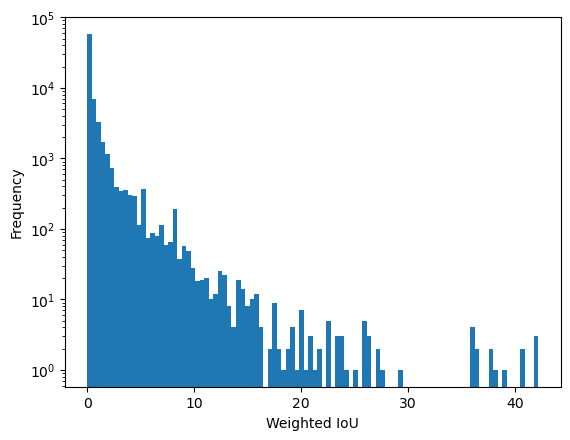

In [11]:
df_test.IouW.plot(kind='hist',bins=100)
plt.yscale('log')
plt.xlabel('Weighted IoU')
plt.savefig('plots/weighted_iou.png',dpi=300)

In [188]:
df_test_b = df_test[df_test['IouW'] > 10]

In [13]:
df_test_b

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,IouW
174,62,100,14,35,0.368421,5.0,6.0,6,0,12.894737
224,33,36,14,37,0.313559,2.2,9.0,5,0,11.601695
242,51,67,5,49,0.266304,2.2,9.0,5,0,13.048913
608,65,132,14,35,0.368421,5.0,4.5,6,0,12.894737
1226,32,47,14,33,0.343750,2.2,6.0,6,0,11.343750
...,...,...,...,...,...,...,...,...,...,...
72323,53,113,14,37,0.406593,2.5,7.0,4,0,15.043956
72647,36,60,5,51,0.281768,2.5,6.0,6,0,14.370166
72715,31,41,14,41,0.305970,4.0,9.0,4,0,12.544776
73958,106,242,5,45,0.250000,6.0,4.5,3,0,11.250000


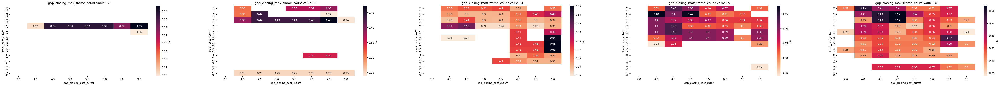

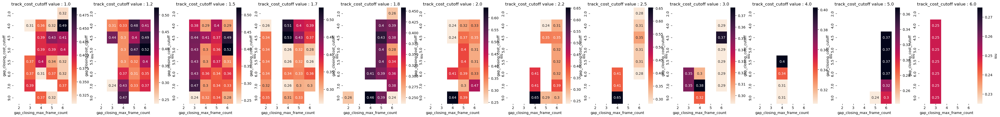

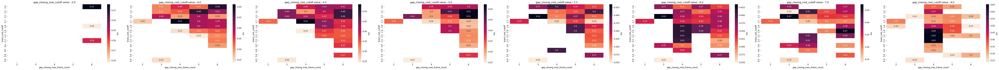

In [27]:
plot_heatmap2D(df_test_b,'iou')

In [39]:
df_b = df_test[(df_test.gap_closing_cost_cutoff == 9.0) & (df_test.gap_closing_max_frame_count == 4) & (df_test.track_cost_cutoff == 2.2)]

<AxesSubplot: ylabel='Frequency'>

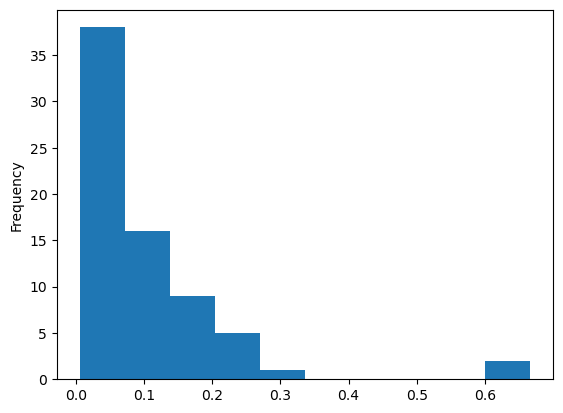

In [40]:
df_b.iou.plot(kind='hist')
# plt.ylim(0,5)

In [41]:
df_b[df_b['count'] > 5]

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,IouW
8455,0,0,29,10,0.158730,2.2,9.0,4,0,1.587302
8456,1,0,30,10,0.117647,2.2,9.0,4,0,1.176471
8457,2,2,12,10,0.169492,2.2,9.0,4,0,1.694915
8460,5,6,8,12,0.133333,2.2,9.0,4,0,1.600000
8464,9,7,12,12,0.244898,2.2,9.0,4,0,2.938776
8466,11,8,29,6,0.230769,2.2,9.0,4,0,1.384615
8468,13,10,20,8,0.666667,2.2,9.0,4,0,5.333333
8469,14,11,5,35,0.192308,2.2,9.0,4,0,6.730769
8477,22,20,30,12,0.214286,2.2,9.0,4,0,2.571429
8478,23,22,5,6,0.028571,2.2,9.0,4,0,0.171429


In [4]:
def plot_results(df,p0,p1,p2):
    df_b = df[(df.gap_closing_cost_cutoff == p0) & (df.gap_closing_max_frame_count == p1) & (df.track_cost_cutoff == p2)]

    df_b.iou.plot(kind='hist')

    print(df_b['count'].max())


89


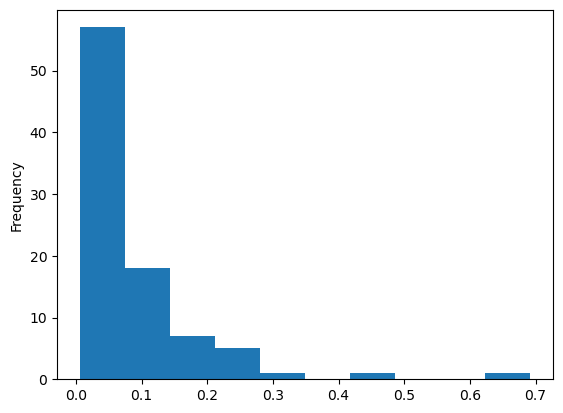

In [50]:
plot_results(df_test,7.0,3,1.5)

/tungstenfs/scratch/ggiorget/nessim/miniconda3/envs/tracking/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/tungstenfs/scratch/ggiorget/nessim/miniconda3/envs/tracking/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/tungstenfs/scratch/ggiorget/nessim/miniconda3/envs/tracking/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/tungstenfs/scratch/ggiorget/nessim/miniconda3/envs/tracking/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/tungstenfs/scratch/ggiorget/nessim/miniconda3/envs/tracking/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/tungstenfs/scratch/ggiorget/nessim/miniconda3/envs/tracking/lib/python3.10

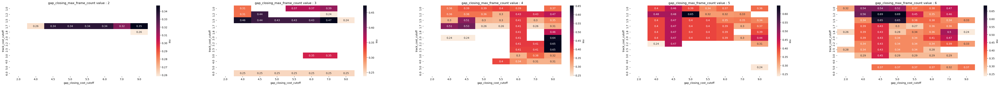

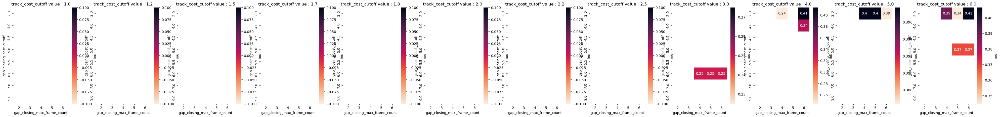

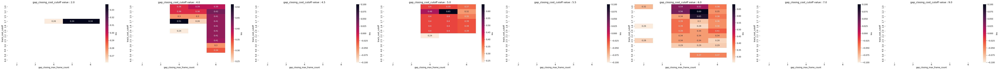

In [70]:
plot_heatmap2D(df_test_b,'iou')

/tungstenfs/scratch/ggiorget/nessim/miniconda3/envs/tracking/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/tungstenfs/scratch/ggiorget/nessim/miniconda3/envs/tracking/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


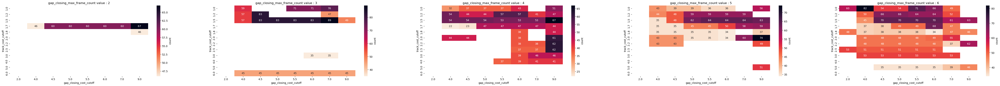

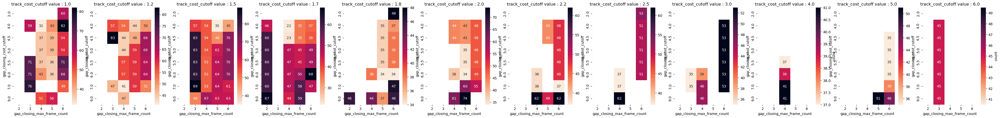

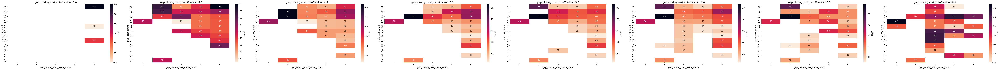

In [58]:
plot_heatmap2D(df_test_b,'count')

In [135]:
a = df_test[(df_test.track_cost_cutoff == 1.5) & (df_test.gap_closing_cost_cutoff == 7.0) & (df_test.gap_closing_max_frame_count == 3)]
a

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,IouW
40542,0,0,29,6,0.230769,1.5,7.0,3,0,1.384615
40543,1,2,12,12,0.300000,1.5,7.0,3,0,3.600000
40544,2,3,10,1,0.021739,1.5,7.0,3,0,0.021739
40545,3,4,20,3,0.250000,1.5,7.0,3,0,0.750000
40546,4,5,12,8,0.160000,1.5,7.0,3,0,1.280000
...,...,...,...,...,...,...,...,...,...,...
40627,85,205,19,2,0.039216,1.5,7.0,3,0,0.078431
40628,86,206,19,1,0.023256,1.5,7.0,3,0,0.023256
40629,87,211,5,1,0.005747,1.5,7.0,3,0,0.005747
40630,88,217,10,8,0.181818,1.5,7.0,3,0,1.454545


In [136]:
a[a.iou == a.iou.max()]

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,IouW
40550,8,10,20,9,0.692308,1.5,7.0,3,0,6.230769


In [123]:
df = df_test_b.copy(deep=True)

In [127]:
set(df.gap_closing_max_frame_count.values)

{2, 3, 4, 5, 6}

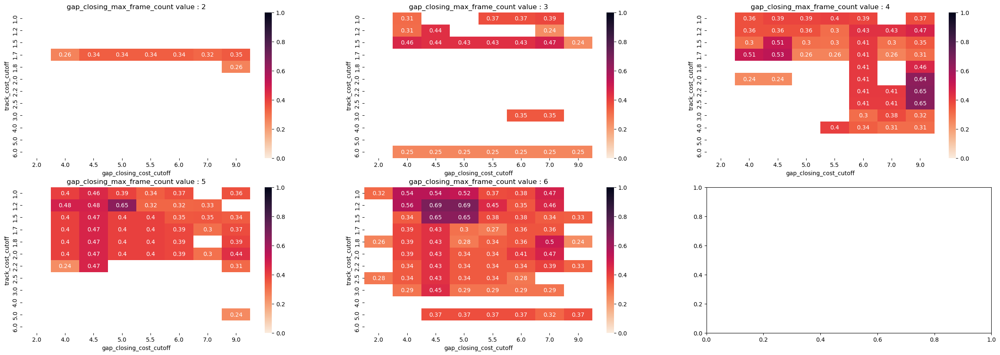

In [130]:
col = 3

df_heat = df.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).max()['iou'].unstack(level=2).copy(deep=True)
fig,ax = plt.subplots(2,col,figsize=(30,10))
counter = 0
for l,i in enumerate(df_heat.columns):
    sns.heatmap(df_heat[i].unstack(level=1),cmap='rocket_r',annot=True,vmin=0,vmax=1,ax=ax[l//col,counter])
    ax[l//col,counter].set_title(f'gap_closing_max_frame_count value : {i}')
    if counter == (col-1):
        counter = 0
    else:
        counter +=1


## plot heatmap 2D

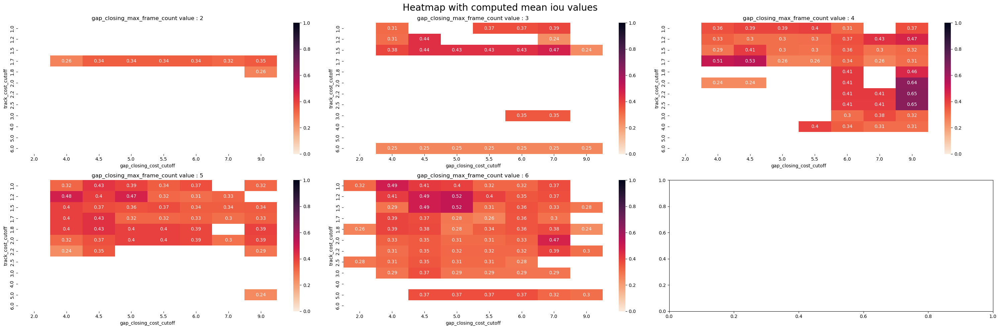

In [14]:
plot_heatmap2D(df_test_b,3,'mean','iou')
plt.savefig('plots/heatmap_mean_iou_50_dt_2.png')

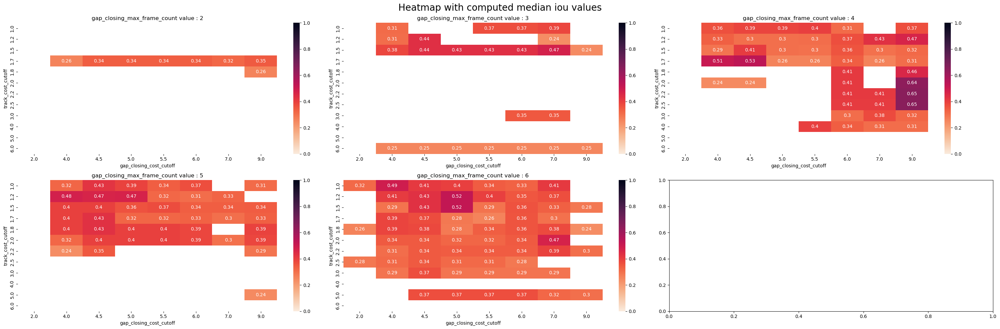

In [155]:
plot_heatmap2D(df_test_b,3,'median','iou')

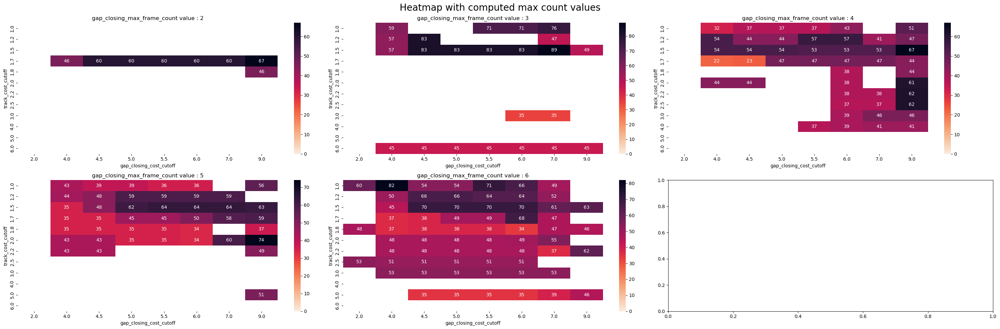

In [35]:
plot_heatmap2D(df_test_b,3,'max','count')
# plt.savefig('plots/heatmap_max_count_50_dt_2.png')

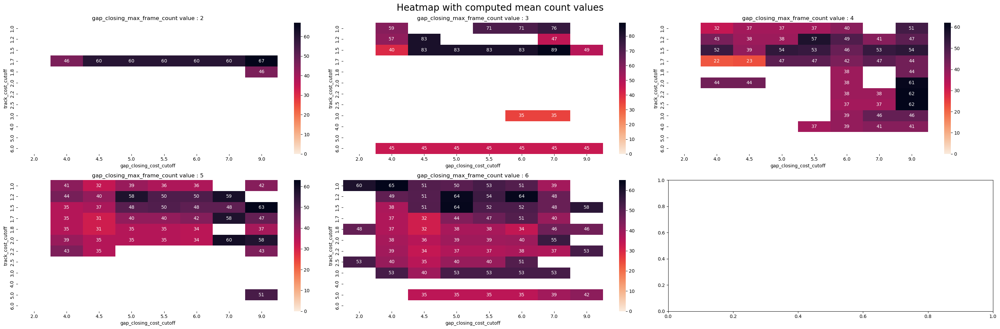

In [48]:
plot_heatmap2D(df_test_b,3,'mean','count')
plt.savefig('plots/heatmap_mean_count_50_dt_2.png')

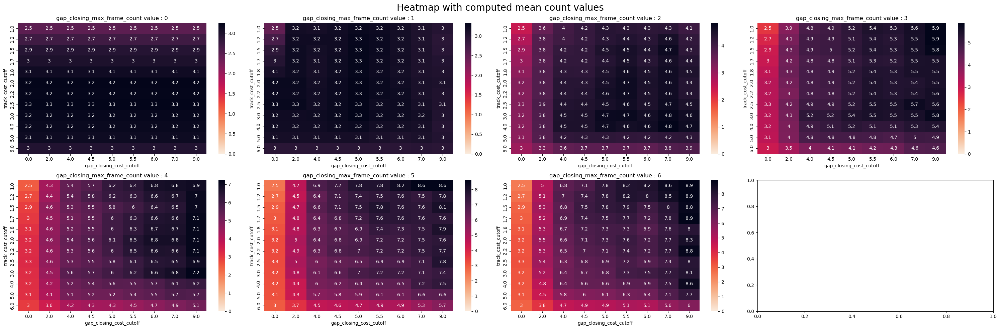

In [168]:
plot_heatmap2D(df_test,4,'mean','count')

89


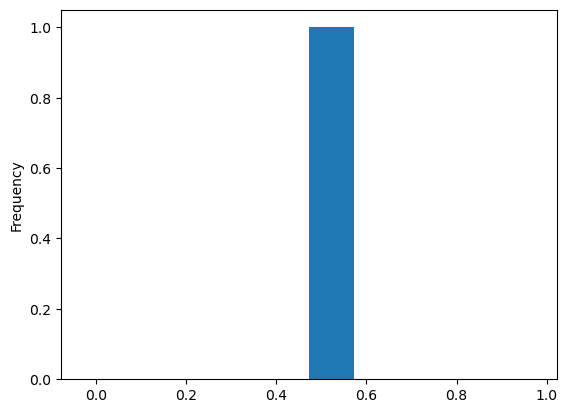

In [10]:
plot_results(df_test_b,7.0,3,1.5)

82


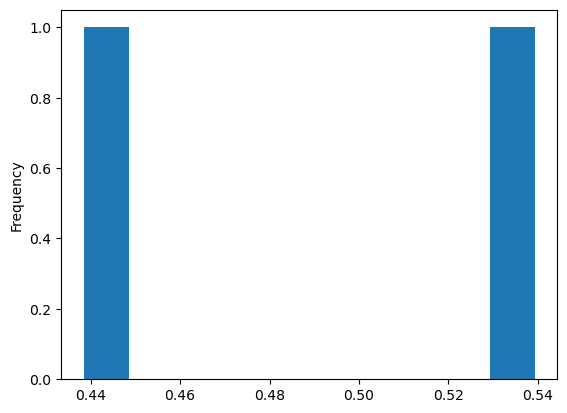

In [57]:
plot_results(df_test_b,4.0,6,1.0)

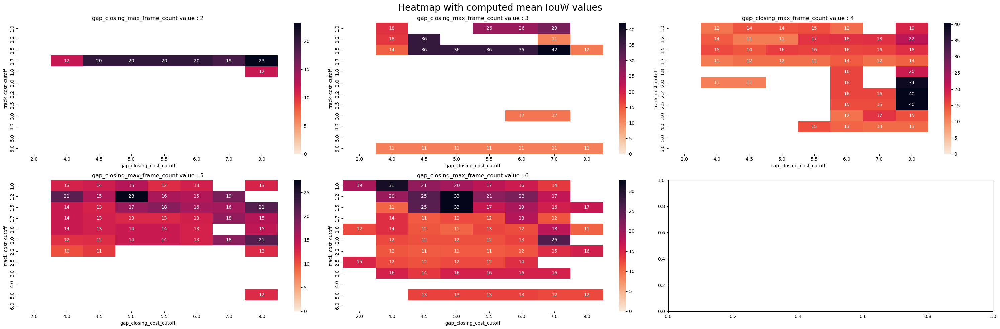

In [11]:
plot_heatmap2D(df_test_b,3,'mean','IouW')

In [12]:
df_best = df_test[(df_test.track_cost_cutoff == 1.5) & (df_test.gap_closing_cost_cutoff == 7.0) & (df_test.gap_closing_max_frame_count == 3)].copy(deep=True)

<AxesSubplot: ylabel='Frequency'>

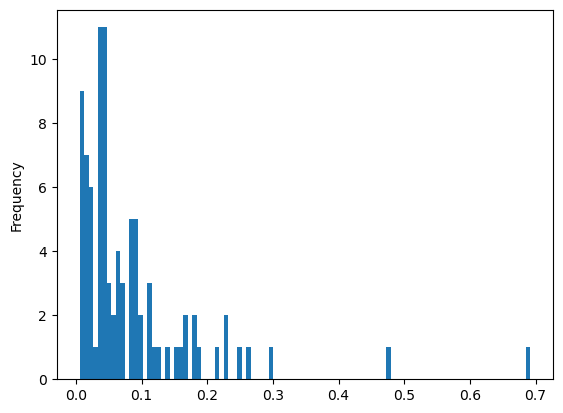

In [19]:
df_best.iou.plot(kind='hist',bins=100)

<AxesSubplot: ylabel='Frequency'>

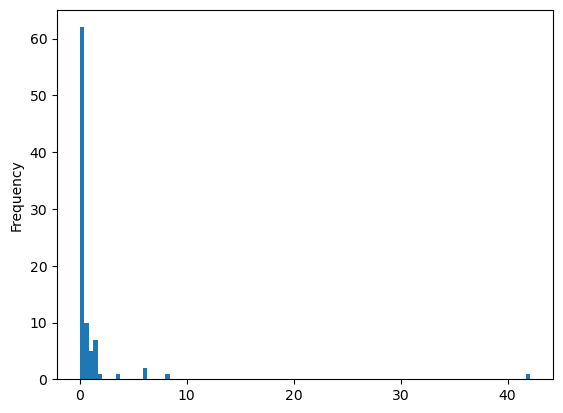

In [20]:
df_best.IouW.plot(kind='hist',bins=100)

In [24]:
df = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/test_lap_code/track_cost_cutoff_1.5_gap_closing_cost_cutoff_7.0_gap_closing_max_frame_count_3_seq_0.csv')

In [26]:
df_g = get_gaps(df)

In [27]:
df_g

,x,y,frame,track_id,gaps
0,7.562998,8.776799,0,0,0
9,8.126444,9.597081,1,0,0
15,7.669317,8.790124,2,0,0
25,7.639307,5.579515,3,0,0
39,7.964264,3.718608,6,0,2
...,...,...,...,...,...
1306,27.375333,26.683010,199,217,1
1289,6.756766,18.728537,195,220,0
1301,8.067077,19.217407,198,220,2
1294,18.605389,29.067746,196,222,0


<AxesSubplot: xlabel='track_id', ylabel='gaps'>

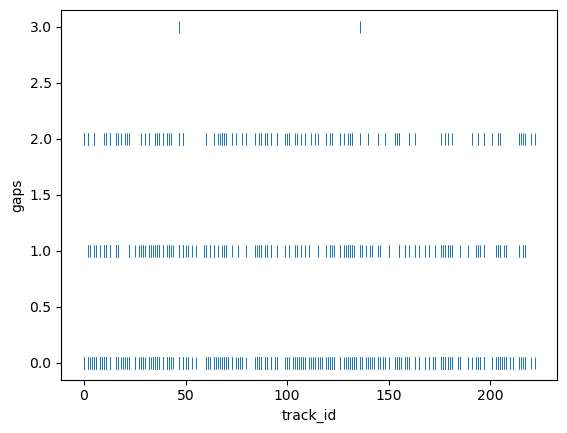

In [39]:
sns.scatterplot(data=df_g,x='track_id',y='gaps',marker='|',s=80)

In [71]:
df_test_b_g = df_test_b.copy(deep=True)

In [60]:
df_test_b_g

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,IouW
174,62,100,14,35,0.368421,5.0,6.0,6,0,12.894737
224,33,36,14,37,0.313559,2.2,9.0,5,0,11.601695
242,51,67,5,49,0.266304,2.2,9.0,5,0,13.048913
608,65,132,14,35,0.368421,5.0,4.5,6,0,12.894737
1226,32,47,14,33,0.343750,2.2,6.0,6,0,11.343750
...,...,...,...,...,...,...,...,...,...,...
72323,53,113,14,37,0.406593,2.5,7.0,4,0,15.043956
72647,36,60,5,51,0.281768,2.5,6.0,6,0,14.370166
72715,31,41,14,41,0.305970,4.0,9.0,4,0,12.544776
73958,106,242,5,45,0.250000,6.0,4.5,3,0,11.250000


In [73]:
df_test_b_g.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count','track_id1']).mean()

Unnamed: 0  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count track_id1               
1.0               2.0                     6                           13                6.0   
                  4.0                     3                           128              38.0   
                                          4                           236              76.0   
                                          5                           140              48.0   
                                                                      161              52.0   
...                                                                                     ...   
6.0               5.0                     3                           234             105.0   
                  5.5                     3                           223             102.0   
                  6.0                     3                           217             102.0   
                  7.0                     3                           186              94.0   
                  9.0                     3                           149              93.0   

                                                                                 track_id2  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count track_id1              
1.0               2.0                     6                           13               5.0   
                  4.0                     3                           128              5.0   
                                          4                           236             14.0   
                                          5                           140             14.0   
                                                                      161              5.0   
...                                                                                    ...   
6.0               5.0                     3                           234              5.0   
                  5.5                     3                           223              5.0   
                  6.0                     3                           217              5.0   
                  7.0                     3                           186              5.0   
                  9.0                     3                           149              5.0   

                                                                                 count  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count track_id1          
1.0               2.0                     6                           13          60.0   
                  4.0                     3                           128         59.0   
                                          4                           236         32.0   
                                          5                           140         39.0   
                                                                      161         43.0   
...                                                                                ...   
6.0               5.0                     3                           234         45.0   
                  5.5                     3                           223         45.0   
                  6.0                     3                           217         45.0   
                  7.0                     3                           186         45.0   
                  9.0                     3                           149         45.0   

                                                                                      iou  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count track_id1             
1.0               2.0                     6                           13         0.315789   
                  4.0                     3                           128        0.308901   
                                          4                           236      

In [79]:
# for each track_cost_cutoff, gap_closing_cost_cutoff, gap_closing_max_frame_count count the number of tracks_id1
df_test_b_g.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).count().track_id1.values

array([1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 2, 1, 1, 1, 3, 1, 2, 1, 3, 1, 3, 1,
       3, 1, 2, 1, 2, 1, 2, 3, 3, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2,
       1, 2, 2, 1, 2, 1, 2, 3, 3, 1, 1, 2, 2, 1, 1, 2, 3, 1, 2, 2, 2, 1,
       1, 2, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 1, 1, 2,
       2, 1, 2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 2, 3, 1, 3, 4, 1, 3, 1, 3, 1, 1, 3, 1, 1,
       1, 2, 1, 2, 2, 4, 3, 3, 1, 3, 1, 1, 1, 2, 2, 1, 2, 3, 2, 2, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 1, 1, 1, 1, 1, 1, 1])

In [80]:
d = df_test_b_g.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).count()[df_test_b_g.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).count().track_id1.values == 4]

In [81]:
d

,,,Unnamed: 0,track_id1,track_id2,count,iou,seq,IouW
track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,,,,,,,
2.0,4.5,6,4,4,4,4,4,4,4
2.2,4.5,6,4,4,4,4,4,4,4


48


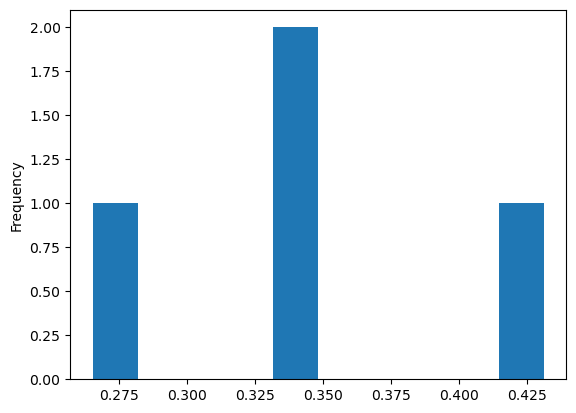

In [82]:
plot_results(df_test_b,4.5,6,2.0)

48


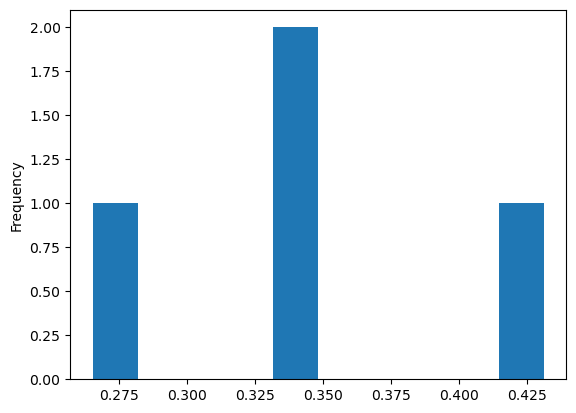

In [83]:
plot_results(df_test_b,4.5,6,2.2)

In [227]:
df_test_f = df_test[df_test['IouW'] < 11]

<AxesSubplot: ylabel='Frequency'>

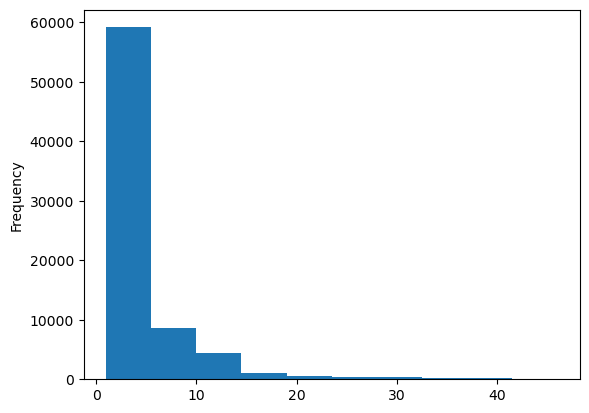

In [228]:
df_test_f['count'].plot(kind='hist')

In [229]:
df_test_f[df_test_f['count'] > 20]

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,IouW
103,103,665,5,25,0.142045,2.5,0.0,0,0,3.551136
121,9,11,5,39,0.214286,5.0,6.0,6,0,8.357143
177,65,109,5,41,0.215789,5.0,6.0,6,0,8.847368
201,10,7,5,31,0.173184,2.2,9.0,5,0,5.368715
207,16,11,5,31,0.148325,2.2,9.0,5,0,4.598086
...,...,...,...,...,...,...,...,...,...,...
75090,15,32,5,37,0.210227,3.0,4.5,3,0,7.778409
75122,47,159,5,24,0.135593,3.0,4.5,3,0,3.254237
75161,86,316,5,28,0.160000,3.0,4.5,3,0,4.480000
75190,21,60,5,31,0.177143,5.0,2.0,5,0,5.491429


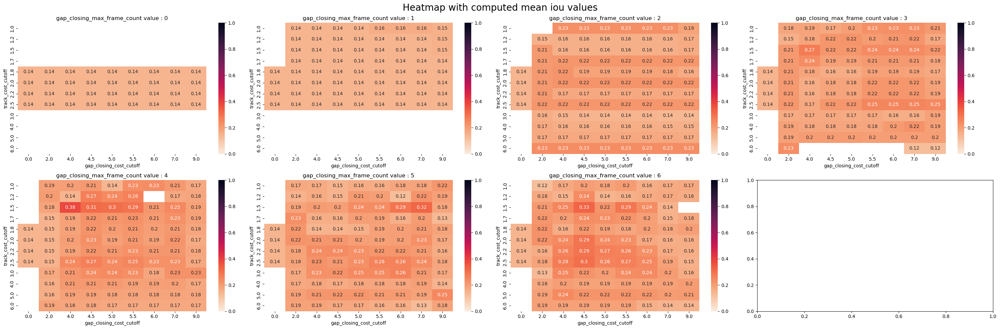

In [230]:
plot_heatmap2D(df_test_f[df_test_f['count'] > 20],4,'mean','iou')

In [161]:
df_test_f_g = df_test_f.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).mean()
df_test_f_g

Unnamed: 0  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
1.0               0.0                     0                             38.000000   
                                          1                             38.000000   
                                          2                             38.000000   
                                          3                             38.000000   
                                          4                             38.000000   
...                                                                           ...   
6.0               9.0                     2                             63.000000   
                                          3                             53.130841   
                                          4                             49.000000   
                                          5                             44.000000   
                                          6                             42.000000   

                                                                        track_id1  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
1.0               0.0                     0                            599.909091   
                                          1                            599.909091   
                                          2                            599.909091   
                                          3                            599.909091   
                                          4                            599.909091   
...                                                                           ...   
6.0               9.0                     2                            107.826772   
                                          3                             81.000000   
                                          4                             59.878788   
                                          5                             47.528090   
                                          6                             36.576471   

                                                                       track_id2  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
1.0               0.0                     0                             9.675325   
                                          1                             9.675325   
                                          2                             9.675325   
                                          3                             9.675325   
                                          4                             9.675325   
...                                                                          ...   
6.0               9.0                     2                            14.708661   
                                          3                            14.485981   
                                          4                            15.111111   
                                          5                            14.539326   
                                          6                            14.741176   

                                                                          count  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count             
1.0               0.0                     0                            2.480519   
                                          1                            2.480519   
                                          2                            2.480519   
                                          3                            2.480519   
                                          4                            2.480519   
...                                                                         ...   
6.0               9.0                     2                            3.858268   
                   

In [217]:
def check_filter(t,g,m):
    path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/test_lap_code/'
    fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
    df_b = df_test_b

    df_tracks_50_best = pd.DataFrame()
    counter = 0
    for file in os.listdir(path):
        if fil in file:
            df = pd.read_csv(os.path.join(path,file))
            df['seq'] = [counter]*len(df)
            df_tracks_50_best = pd.concat([df_tracks_50_best,df])
            counter +=1

    fig,ax = plt.subplots(figsize=(8,5))
    for i in range(1):
        l = df_b[(df_b.seq == i) & (df_b.track_cost_cutoff == t) & (df_b.gap_closing_cost_cutoff == g) & (df_b.gap_closing_max_frame_count == m)].track_id1.unique()
        f = df_tracks_50_best[df_tracks_50_best.seq == i].copy(deep=True).groupby('track_id').size()
        f = pd.DataFrame(f)
        f['in?'] = f.index.isin(l)
        f.reset_index(drop=True,inplace=True)
        sns.histplot(data=f,x=0,hue='in?')
        plt.xlabel('Length of the tracks (frames)')
        plt.legend(['True','False'],title = 'Filtered \n tracks')
        fig.suptitle(f'concentration 50 pM \n track_cost_cutoff:{t} \n gap_closing_cost_cutoff:{g} \n gap_closing_max_frame_count:{m}')
        ax.set_xlabel('track length')
        fig.tight_layout()

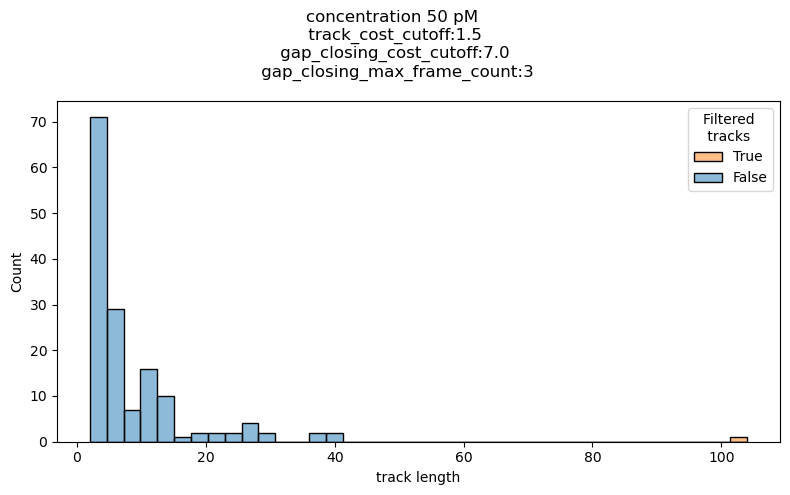

In [219]:
check_filter(1.5,7.0,3)
plt.savefig('plots/filter_50_dt_2.png')

In [34]:
g.groupby('track_id').size()

array([ 10,  15,   3,   3,  21,   6,  10,   2,  10, 104,  15,  38,  26,
         2,   2,   2,   4,  10,   4,   2,   4,   6,   3,  26,   3,   4,
        10,  25,   8,  14,   7,  38,   5,   2,  25,  12,   3,   3,   2,
         2,   3,  11,   3,   5,  11,   2,   3,   2,  10,   7,  14,   3,
         6,   2,   2,   2,   3,   5,   5,   7,  13,  27,   6,  30,  27,
         3,  29,   3,   3,   9,   2,   5,   7,   3,   5,   4,   5,   4,
         2,   2,   2,   4,   2,   2,   5,   2,  39,   5,   6,  15,   4,
         2,  15,   9,  17,   7,   3,   8,   5,   3,   3,   5,   2,   2,
         6,   3,   2,   3,   4,   5,   4,  22,   2,   8,   3,   5,  10,
        15,   4,   7,   6,   7,  18,  10,  10,  19,   4,   8,   2,  41,
         3,   3,  11,  11,   7,  11,   3,   3,  15,  11,   2,   3,  14,
         2,   2,   6,   3,   4,   8,   2,   2])

# dt = 10

In [62]:
df_10 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_10/filtered_tracks/evaluation/combined/combined_results.csv')

In [99]:
df_10

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw
0,0,30,12,2,0.333333,1.0,0.0,0,1,0.666667
1,1,41,29,2,0.285714,1.0,0.0,0,1,0.571429
2,2,59,12,1,0.142857,1.0,0.0,0,1,0.142857
3,3,60,5,1,0.029412,1.0,0.0,0,1,0.029412
4,4,65,5,4,0.121212,1.0,0.0,0,1,0.484848
...,...,...,...,...,...,...,...,...,...,...
17046,24,62,19,2,0.166667,4.0,6.0,2,3,0.333333
17047,25,69,5,2,0.051282,4.0,6.0,2,3,0.102564
17048,26,69,10,1,0.083333,4.0,6.0,2,3,0.083333
17049,27,77,19,2,0.166667,4.0,6.0,2,3,0.333333


In [67]:
df_10['iouw'] = df_10['iou']*df_10['count']

<AxesSubplot: ylabel='Frequency'>

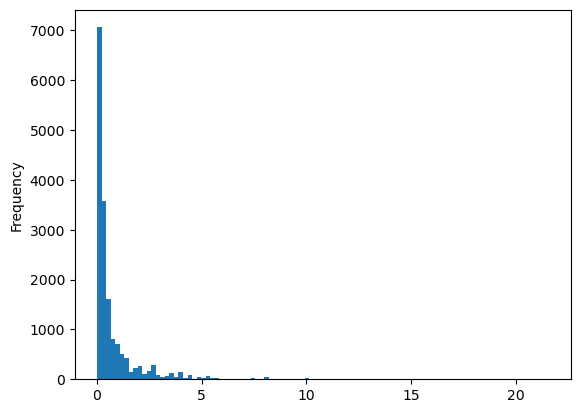

In [89]:
df_10.iouw.plot(kind='hist',bins=100)

In [68]:
df_10_b = df_10[df_10.iouw > 1]

In [101]:
df_10_b

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw
19,1,5,20,2,1.000000,4.0,0.0,4,4,2.000000
22,4,18,5,11,0.297297,4.0,0.0,4,4,3.270270
24,6,23,12,5,0.500000,4.0,0.0,4,4,2.500000
25,7,26,30,5,0.555556,4.0,0.0,4,4,2.777778
28,10,44,8,4,0.363636,4.0,0.0,4,4,1.454545
...,...,...,...,...,...,...,...,...,...,...
17030,8,15,8,5,0.384615,4.0,6.0,2,3,1.923077
17033,11,27,14,9,0.450000,4.0,6.0,2,3,4.050000
17036,14,45,19,4,0.285714,4.0,6.0,2,3,1.142857
17039,17,50,5,10,0.270270,4.0,6.0,2,3,2.702703


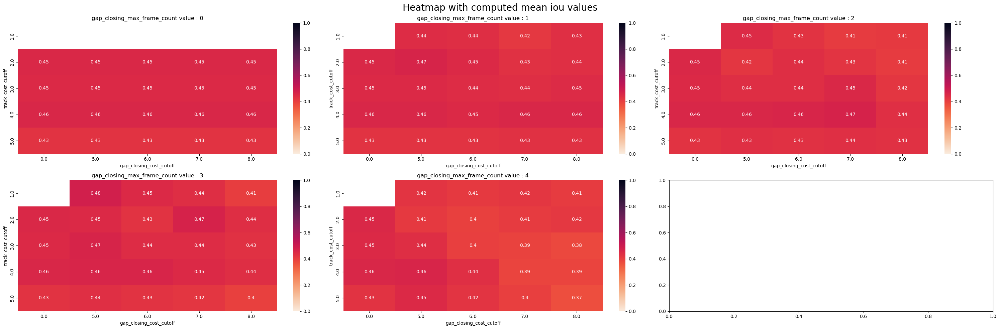

In [108]:
plot_heatmap2D(df_10_b,3,'mean','iou')

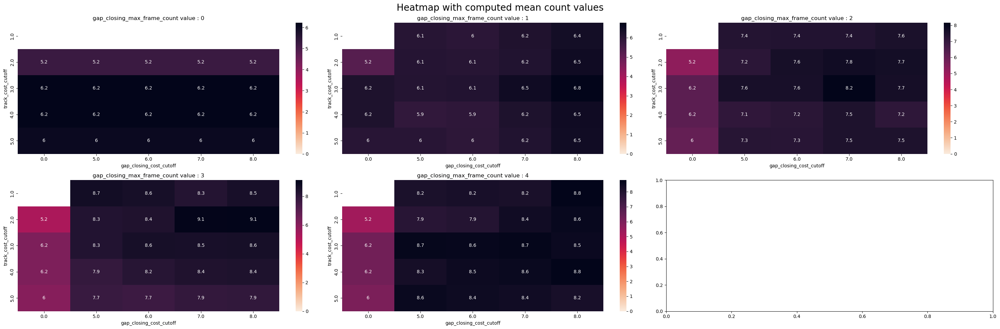

In [109]:
plot_heatmap2D(df_10_b,3,'mean','count')

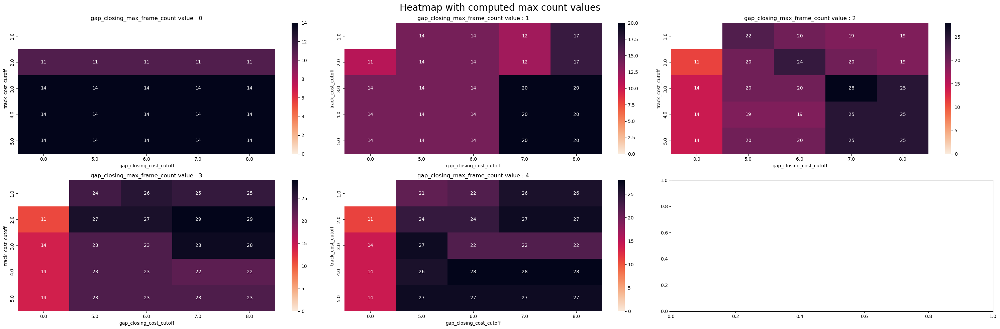

In [111]:
plot_heatmap2D(df_10_b,3,'max','count')

28


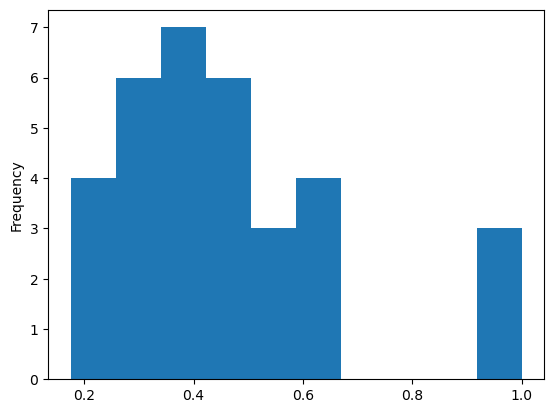

In [112]:
plot_results(df_10_b,7.0,2,3.0)

# 75pM dt_10

In [63]:
df_75 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/75pM/dt_10/filtered_tracks/evaluation/combined/combined_results.csv')

In [66]:
df_75['iouw'] = df_75['iou']*df_75['count']

In [69]:
df_75_b = df_75[df_75.iouw > 1]

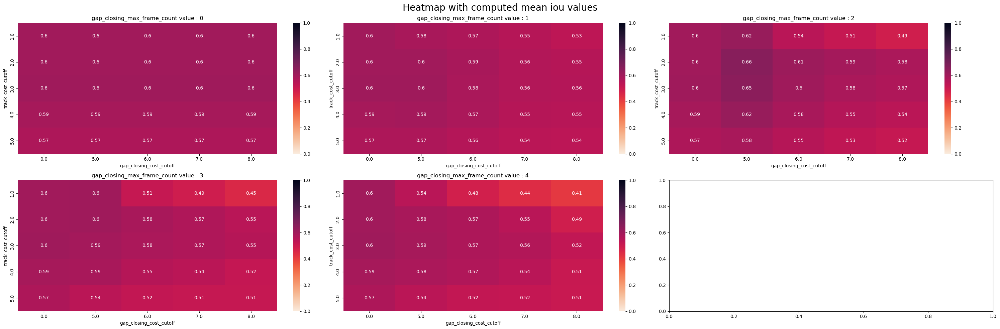

In [128]:
plot_heatmap2D(df_75_b,3,'mean','iou')

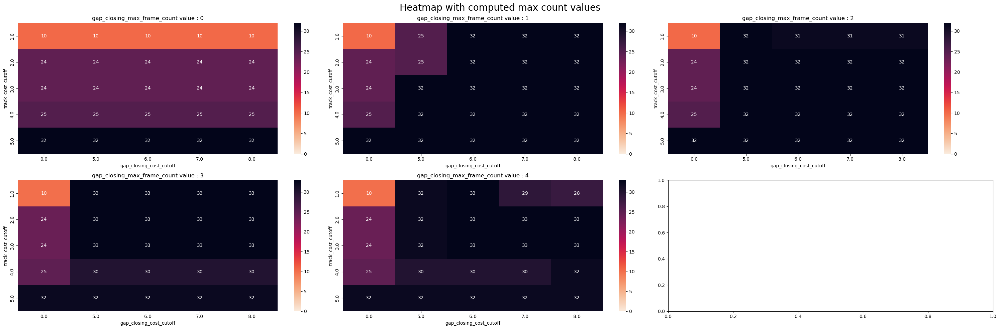

In [129]:
plot_heatmap2D(df_75_b,3,'max','count')

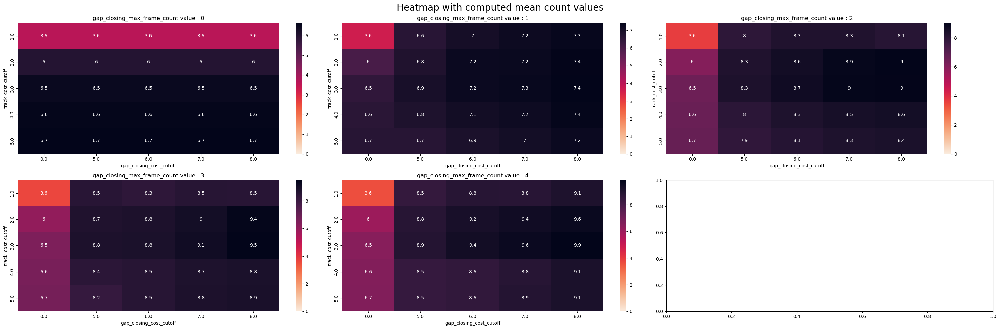

In [130]:
plot_heatmap2D(df_75_b,3,'mean','count')

32


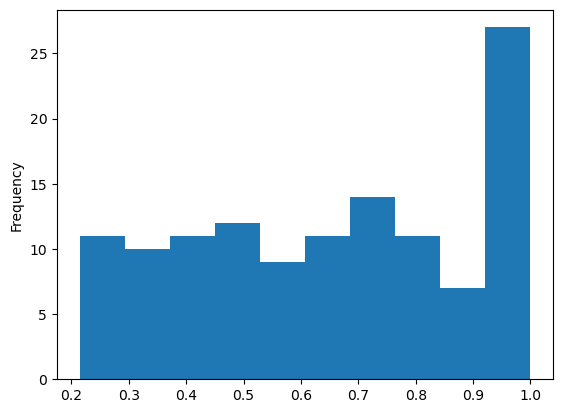

In [131]:
plot_results(df_75_b,5.0,2,2.0)

# Sanity check 50pM dt_2 40 frames

In [132]:
df_50_4 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/croped_frame/evaluation/combined/combined_results.csv')

In [134]:
df_50_4['iouw'] = df_50_4['iou']*df_50_4['count']

<AxesSubplot: ylabel='Frequency'>

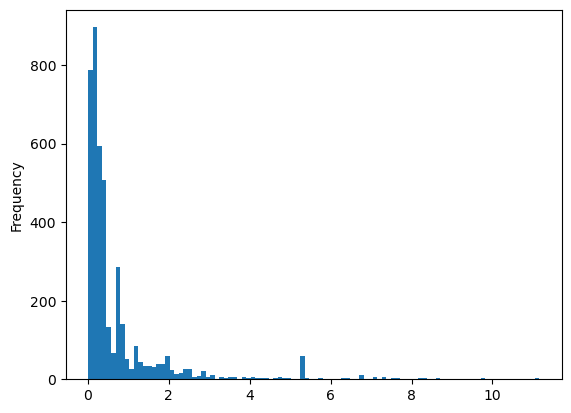

In [135]:
df_50_4.iouw.plot(kind='hist',bins=100)

In [136]:
df_50_4_b = df_50_4[df_50_4.iouw > 1]

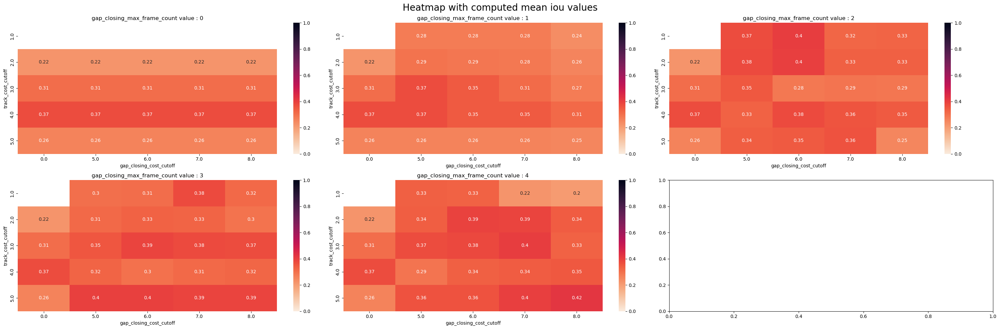

In [137]:
plot_heatmap2D(df_50_4_b,3,'mean','iou')

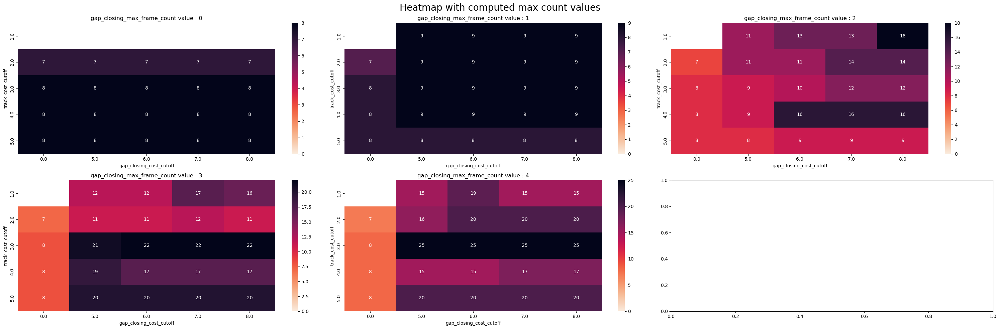

In [138]:
plot_heatmap2D(df_50_4_b,3,'max','count')

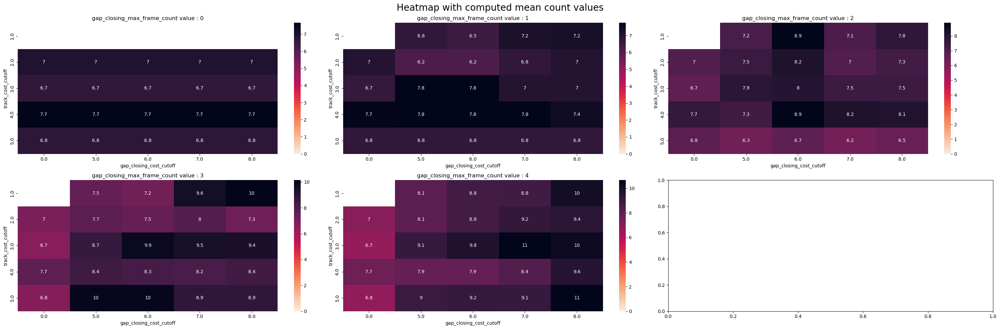

In [139]:
plot_heatmap2D(df_50_4_b,3,'mean','count')

# 100 pM dt 10

In [64]:
df_100 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_10/filtered_tracks/evaluation/combined/combined_results.csv')

In [65]:
df_100['iouw'] = df_100['iou']*df_100['count']

<AxesSubplot: ylabel='Frequency'>

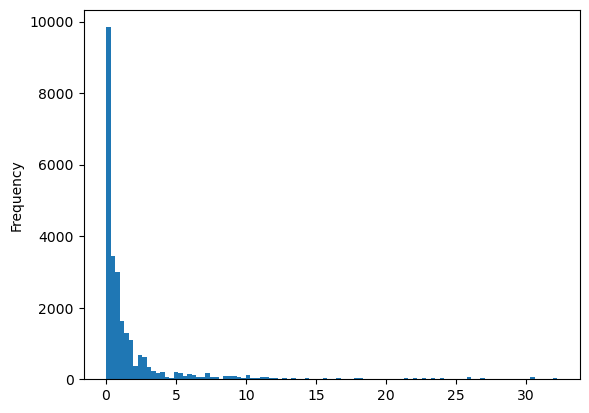

In [167]:
df_100.iouw.plot(kind='hist',bins=100)

In [70]:
df_100_b = df_100[df_100.iouw > 1]

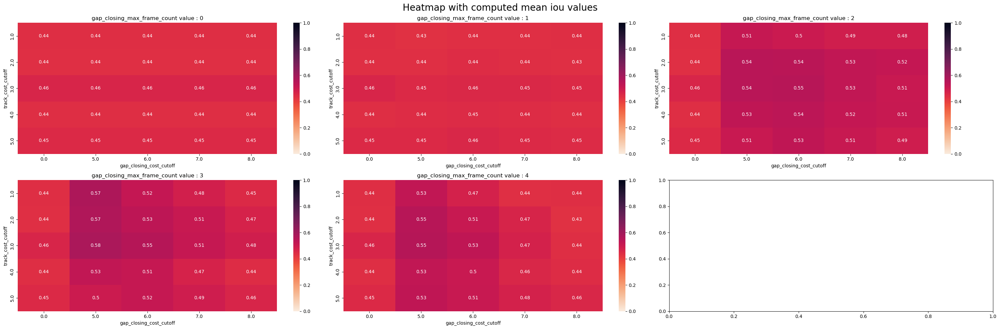

In [169]:
plot_heatmap2D(df_100_b,3,'mean','iou')

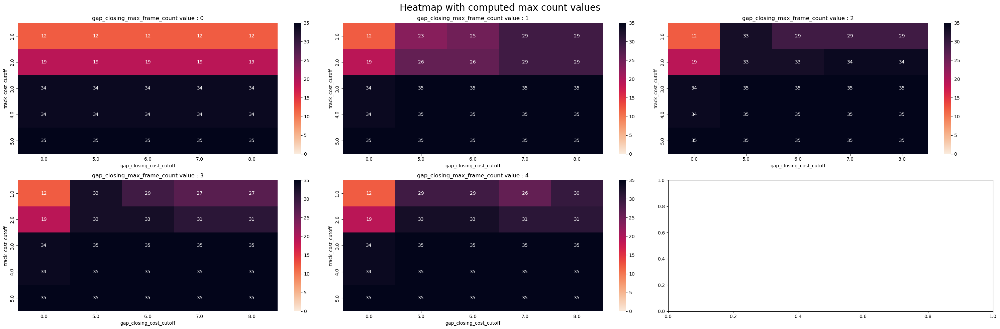

In [170]:
plot_heatmap2D(df_100_b,3,'max','count')

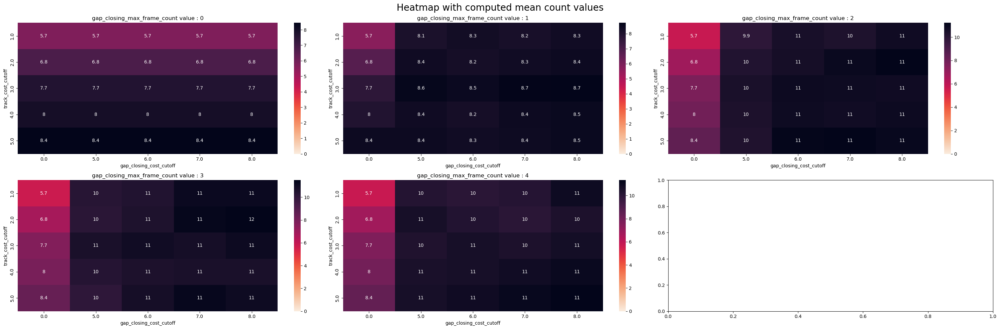

In [171]:
plot_heatmap2D(df_100_b,3,'mean','count')

In [309]:
df_100_b.to_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/final_dataframes/df_100_b.csv',index=False)

## Build big heatmap

In [281]:
best_100 = df_100[(df_100.track_cost_cutoff == 2.0) & (df_100.gap_closing_cost_cutoff == 6.0) & (df_100.gap_closing_max_frame_count == 2)].copy(deep=True)
best_100['concentration'] = [100]*len(best_100)
best_50 = df_10[(df_10.track_cost_cutoff == 3.0) & (df_10.gap_closing_cost_cutoff == 7.0) & (df_10.gap_closing_max_frame_count == 3)].copy(deep=True)
best_50['concentration'] = [50]*len(best_50)
best_75 = df_75[(df_75.track_cost_cutoff == 2.0) & (df_75.gap_closing_cost_cutoff == 5.0) & (df_75.gap_closing_max_frame_count == 2)].copy(deep=True)
best_75['concentration'] = [75]*len(best_75)

In [134]:
best_100_b = df_100_b[(df_100_b.track_cost_cutoff == 3.0) & (df_100_b.gap_closing_cost_cutoff == 5.0) & (df_100_b.gap_closing_max_frame_count == 3)].copy(deep=True)
best_100_b['concentration'] = [100]*len(best_100_b)
best_50_b = df_10_b[(df_10_b.track_cost_cutoff == 3.0) & (df_10_b.gap_closing_cost_cutoff == 7.0) & (df_10_b.gap_closing_max_frame_count == 3)].copy(deep=True)
best_50_b['concentration'] = [50]*len(best_50_b)
best_75_b = df_75_b[(df_75_b.track_cost_cutoff == 2.0) & (df_75_b.gap_closing_cost_cutoff == 5.0) & (df_75_b.gap_closing_max_frame_count == 2)].copy(deep=True)
best_75_b['concentration'] = [75]*len(best_75_b)

In [135]:
df_comb_b = pd.concat([best_100_b,best_50_b,best_75_b])[['iou','track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count','concentration']].reset_index(drop=True)
df_comb = pd.concat([best_100,best_50,best_75])[['iou','track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count','concentration']].reset_index(drop=True)

In [233]:
df_comb

,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,concentration
0,0.500000,3.0,5.0,3,100
1,0.483871,3.0,5.0,3,100
2,0.250000,3.0,5.0,3,100
3,0.272727,3.0,5.0,3,100
4,1.000000,3.0,5.0,3,100
...,...,...,...,...,...
230,1.000000,2.0,5.0,2,75
231,0.600000,2.0,5.0,2,75
232,1.000000,2.0,5.0,2,75
233,0.800000,2.0,5.0,2,75


In [136]:
df_plot = df_comb[['iou','concentration']]
df_plot_b = df_comb_b[['iou','concentration']]

In [ ]:
fig,ax = plt.subplots()
sns.heatmap(df_plot.groupby('concentration').mean(),annot=True,vmin=0,vmax=1)
plt.text(0.5,0.68,
 f'track_cost_cutoff:{df_comb[df_comb.concentration == 50].track_cost_cutoff.values[0]},\n gap_closing_cost_cutoff:{df_comb[df_comb.concentration == 50].gap_closing_cost_cutoff.values[0]},\n gap_closing_max_frame_count:{df_comb[df_comb.concentration == 50].gap_closing_max_frame_count.values[0]}'
, ha='center', va='bottom', transform=ax.transAxes, fontsize=9,c='white')

plt.text(0.5,0.34,
 f'track_cost_cutoff:{df_comb[df_comb.concentration == 75].track_cost_cutoff.values[0]},\n gap_closing_cost_cutoff:{df_comb[df_comb.concentration == 75].gap_closing_cost_cutoff.values[0]},\n gap_closing_max_frame_count:{df_comb[df_comb.concentration == 75].gap_closing_max_frame_count.values[0]}'
, ha='center', va='bottom', transform=ax.transAxes, fontsize=9,c='white')

plt.text(0.5,0.02,
 f'track_cost_cutoff:{df_comb[df_comb.concentration == 100].track_cost_cutoff.values[0]},\n gap_closing_cost_cutoff:{df_comb[df_comb.concentration == 100].gap_closing_cost_cutoff.values[0]},\n gap_closing_max_frame_count:{df_comb[df_comb.concentration == 100].gap_closing_max_frame_count.values[0]}'
, ha='center', va='bottom', transform=ax.transAxes, fontsize=9,c='white')

In [ ]:
fig,ax = plt.subplots()
sns.heatmap(df_plot_b.groupby('concentration').mean(),annot=True,vmin=0,vmax=1)
plt.text(0.5,0.68,
 f'track_cost_cutoff:{df_comb[df_comb.concentration == 50].track_cost_cutoff.values[0]},\n gap_closing_cost_cutoff:{df_comb[df_comb.concentration == 50].gap_closing_cost_cutoff.values[0]},\n gap_closing_max_frame_count:{df_comb[df_comb.concentration == 50].gap_closing_max_frame_count.values[0]}'
, ha='center', va='bottom', transform=ax.transAxes, fontsize=9,c='white')

plt.text(0.5,0.34,
 f'track_cost_cutoff:{df_comb[df_comb.concentration == 75].track_cost_cutoff.values[0]},\n gap_closing_cost_cutoff:{df_comb[df_comb.concentration == 75].gap_closing_cost_cutoff.values[0]},\n gap_closing_max_frame_count:{df_comb[df_comb.concentration == 75].gap_closing_max_frame_count.values[0]}'
, ha='center', va='bottom', transform=ax.transAxes, fontsize=9,c='white')

plt.text(0.5,0.02,
 f'track_cost_cutoff:{df_comb[df_comb.concentration == 100].track_cost_cutoff.values[0]},\n gap_closing_cost_cutoff:{df_comb[df_comb.concentration == 100].gap_closing_cost_cutoff.values[0]},\n gap_closing_max_frame_count:{df_comb[df_comb.concentration == 100].gap_closing_max_frame_count.values[0]}'
, ha='center', va='bottom', transform=ax.transAxes, fontsize=9,c='white')

### Dt2 data

In [282]:
best_100_2 = df_100_2_b[(df_100_2_b.track_cost_cutoff == 2.5) & (df_100_2_b.gap_closing_cost_cutoff == 5.0) & (df_100_2_b.gap_closing_max_frame_count == 3)].copy(deep=True)
best_100_2['concentration'] = [100]*len(best_100_2)
best_50_2 = df_test_b[(df_test_b.track_cost_cutoff == 1.5) & (df_test_b.gap_closing_cost_cutoff == 7.0) & (df_test_b.gap_closing_max_frame_count == 3)].copy(deep=True)
best_50_2['concentration'] = [50]*len(best_50_2)
best_75_2 = df_75_2_b[(df_75_2_b.track_cost_cutoff == 1.0) & (df_75_2_b.gap_closing_cost_cutoff == 5.0) & (df_75_2_b.gap_closing_max_frame_count == 2)].copy(deep=True)
best_75_2['concentration'] = [75]*len(best_75_2)

In [283]:
best_100_2

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw,concentration
11200,4,4,3,42,0.308824,2.5,5.0,3,0,12.970588,100
11223,27,28,137,76,0.439306,2.5,5.0,3,0,33.387283,100
11235,39,49,7,33,0.458333,2.5,5.0,3,0,15.125000,100
11237,41,53,5,22,0.536585,2.5,5.0,3,0,11.804878,100
11260,64,102,218,47,0.460784,2.5,5.0,3,0,21.656863,100
11264,68,105,210,55,0.292553,2.5,5.0,3,0,16.090426,100
11276,80,124,100,17,0.680000,2.5,5.0,3,0,11.560000,100
11299,103,166,137,57,0.322034,2.5,5.0,3,0,18.355932,100
11318,122,199,75,35,0.330189,2.5,5.0,3,0,11.556604,100
11322,126,211,162,21,0.488372,2.5,5.0,3,0,10.255814,100


In [284]:
df_comb_2_b = pd.concat([best_100_2,best_50_2,best_75_2]).reset_index(drop=True)
df_comb_2_b = df_comb_2_b[['iou','concentration']]

In [285]:
df_comb_2_b['dt'] = [2]*len(df_comb_2_b)

In [286]:
df_plot_b['dt'] = [10]*len(df_plot_b)

/scratch/louaness/ipykernel_327153/1624512412.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot_b['dt'] = [10]*len(df_plot_b)


In [287]:
df_plot = pd.concat([df_plot_b,df_comb_2_b])

In [288]:
a = df_plot.groupby(['concentration','dt']).mean().unstack(level=0)

In [ ]:
a

In [ ]:
sns.heatmap(data=a.T,vmin=0,vmax=1,annot=True)

# Finding the criteria to filter the tracks

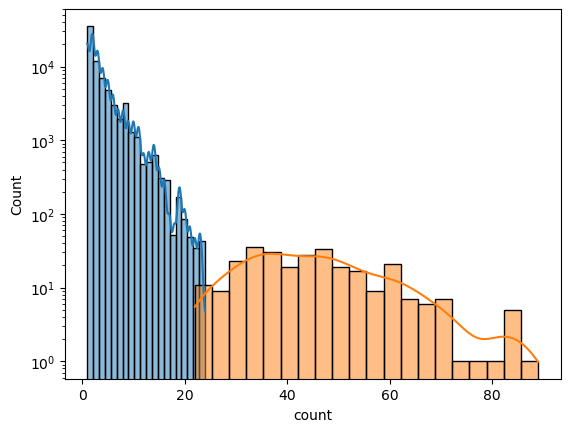

In [255]:
sns.histplot(df_test_f[df_test_f.IouW < 3]['count'],bins=20,kde=True)
sns.histplot(df_test_b['count'],bins=20,kde=True)
plt.yscale('log')

In [480]:
df_100_b

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw
6,6,9,7,4,0.266667,1.0,0.0,0,1,1.066667
26,26,101,218,6,0.300000,1.0,0.0,0,1,1.800000
31,31,120,3,6,0.206897,1.0,0.0,0,1,1.241379
52,0,0,0,2,0.666667,4.0,0.0,4,4,1.333333
56,4,5,3,8,0.296296,4.0,0.0,4,4,2.370370
...,...,...,...,...,...,...,...,...,...,...
25675,21,14,137,29,0.743590,4.0,6.0,2,3,21.564103
25677,23,15,7,12,0.631579,4.0,6.0,2,3,7.578947
25685,31,31,210,20,0.500000,4.0,6.0,2,3,10.000000
25687,33,32,75,15,0.576923,4.0,6.0,2,3,8.653846


In [6]:
def check_filter(concentration,t,g,m):
    if concentration == 50:
        path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_10/filtered_tracks/'
        fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
        df_b = df_10_b
    elif concentration == 75:
        path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/75pM/dt_10/filtered_tracks/'
        fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
        df_b = df_75_b
    elif concentration == 100:
        path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_10/filtered_tracks/'
        fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
        df_b = df_100_b

    df_tracks_50_best = pd.DataFrame()
    counter = 0
    for file in os.listdir(path):
        if fil in file:
            df = pd.read_csv(os.path.join(path,file))
            df['seq'] = [nfs.get_nums(os.path.join(path,file))[-1]]*len(df)
            df_tracks_50_best = pd.concat([df_tracks_50_best,df])
            counter +=1
    fig,ax = plt.subplots(2,3,figsize=(15,10))
    ax = ax.ravel()
    for i in range(5):
        df_filter = df_b[(df_b.seq == i) & (df_b.track_cost_cutoff == t) & (df_b.gap_closing_cost_cutoff == g) & (df_b.gap_closing_max_frame_count == m)]
        if df_filter.empty:
            l = [1000]
        else:
            l = df_filter.track_id1.unique()
        f = df_tracks_50_best[df_tracks_50_best.seq == i].copy(deep=True).groupby('track_id').size()
        f = pd.DataFrame(f)
        f['in?'] = f.index.isin(l)
        f.reset_index(drop=True,inplace=True)
        sns.histplot(data=f,x=0,hue='in?',ax=ax[i])
        fig.suptitle(f'concentration {concentration} pM \n track_cost_cutoff:{t} \n gap_closing_cost_cutoff:{g} \n gap_closing_max_frame_count:{m}')
        ax[i].set_xlabel('track length')

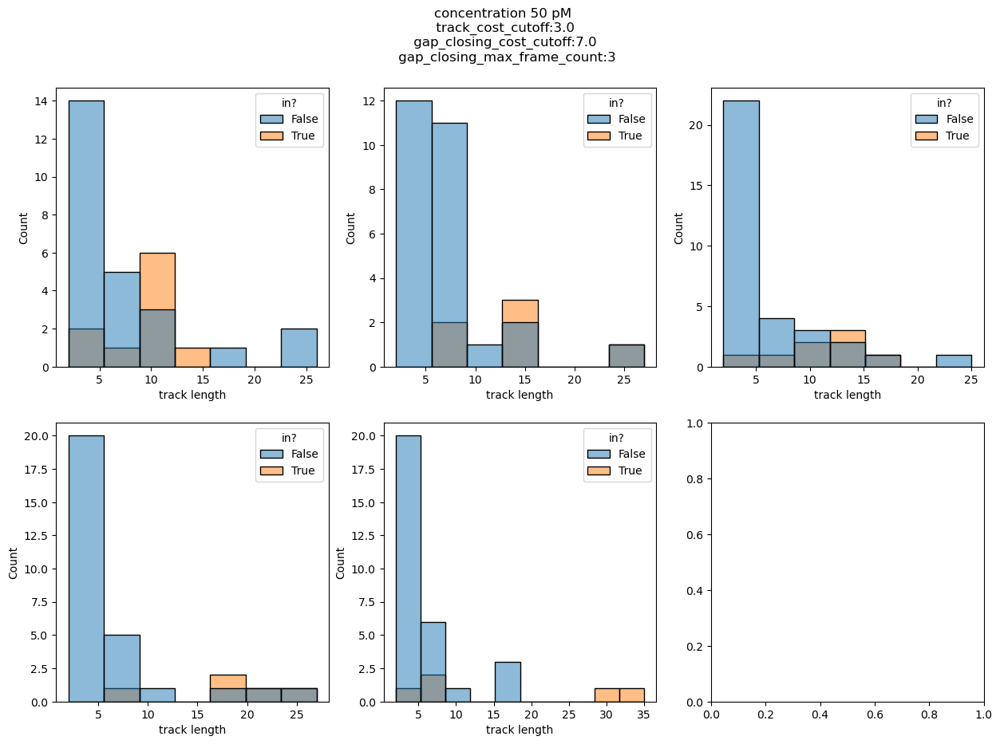

In [495]:
check_filter(50,3.0,7.0,3)
# plt.savefig('plots/filter_50_dt_10.png')

# 75pM dt 2 

In [4]:
df_75_2 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/75pM/dt_2/filtered_tracks/evaluation/combined/combined_results.csv')


In [5]:
df_75_2['iouw'] = df_75_2['iou'] * df_75_2['count']

<AxesSubplot: >

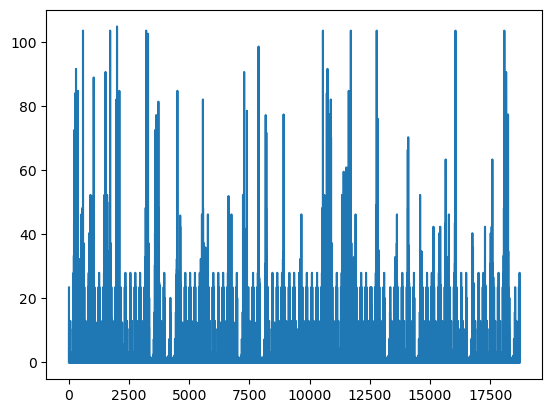

In [9]:
df_75_2['iouw'].plot()

In [6]:
df_75_2_b = df_75_2[df_75_2['iouw'] > 10]

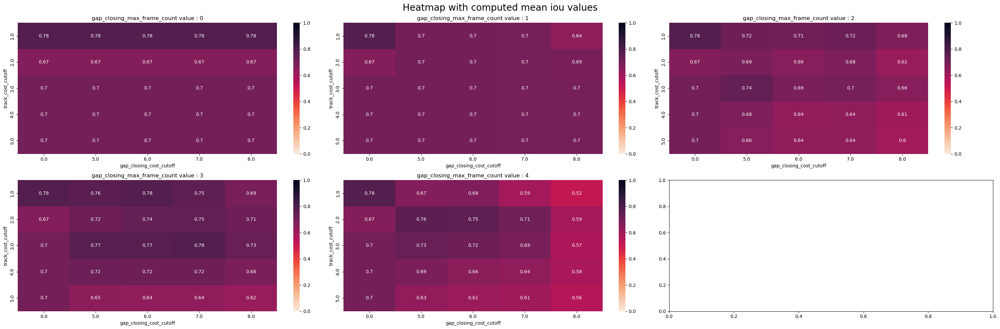

In [312]:
plot_heatmap2D(df_75_2_b,3,'mean','iou')

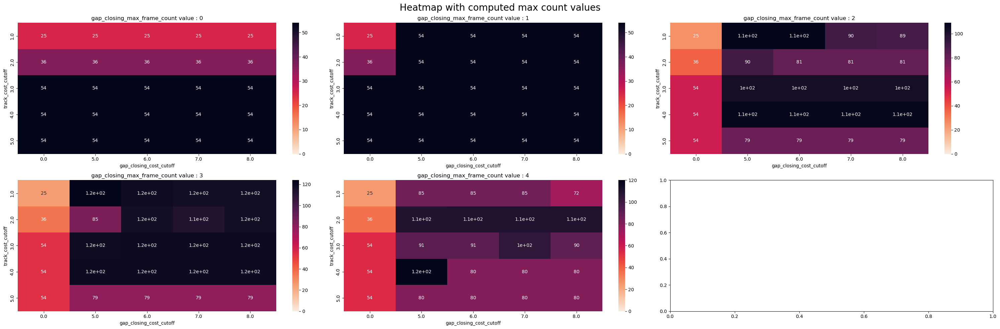

In [310]:
plot_heatmap2D(df_75_2_b,3,'max','count')

In [11]:
df_75_2_b

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw
4,4,9,3,27,0.870968,2.0,6.0,0,0,23.516129
57,57,282,27,26,0.500000,2.0,6.0,0,0,13.000000
167,167,660,65,36,0.292683,2.0,6.0,0,0,10.536585
196,196,782,174,28,1.000000,2.0,6.0,0,0,28.000000
208,0,1,4,71,0.470199,3.0,5.0,4,0,33.384106
...,...,...,...,...,...,...,...,...,...,...
18521,232,1078,174,21,0.750000,1.0,6.0,0,0,15.750000
18534,5,9,3,27,0.870968,4.0,7.0,0,0,23.516129
18584,55,212,27,26,0.500000,4.0,7.0,0,0,13.000000
18690,161,511,65,54,0.435484,4.0,7.0,0,0,23.516129


In [34]:
df_75_2_b['hmean'] = (2 * (df_75_2_b['iou'] * (df_75_2_b['count']/195))) / (df_75_2_b['iou'] + (df_75_2_b['count']/195))

/scratch/louaness/ipykernel_170625/1286892741.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_75_2_b['hmean'] = (2 * (df_75_2_b['iou'] * (df_75_2_b['count']/195))) / (df_75_2_b['iou'] + (df_75_2_b['count']/195))


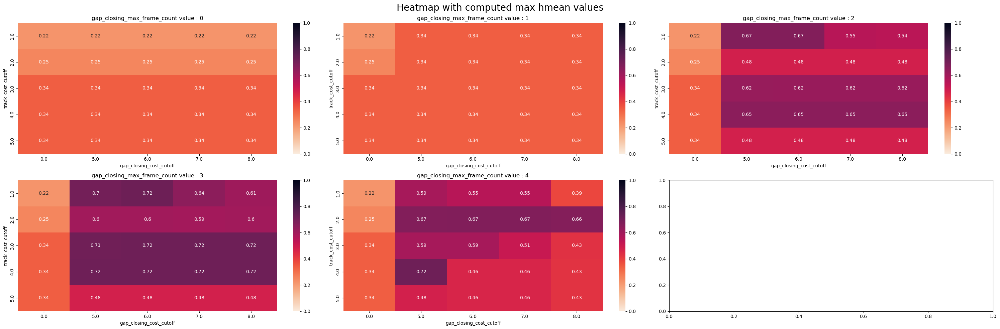

In [47]:
plot_heatmap2D(df_75_2_b,3,'max','hmean')

In [37]:
df_t = df_75_2_b.copy(deep=True)

In [38]:
df_t = df_t.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).mean()

In [41]:
df_t['hmean'] = (2 * (df_t['iou'] * (df_t['count']/195))) / (df_t['iou'] + (df_t['count']/195))

<AxesSubplot: ylabel='Frequency'>

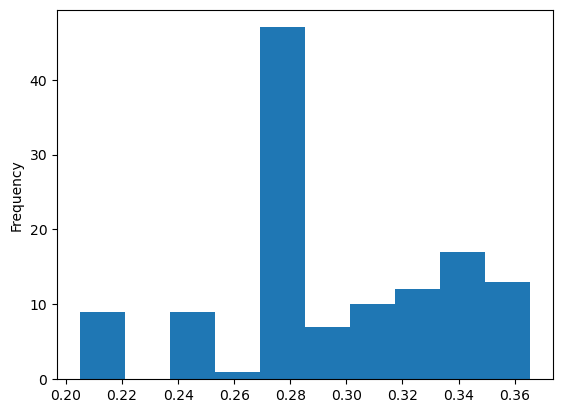

In [42]:
df_t['hmean'].plot(kind='hist')

In [46]:
df_t[df_t.hmean == df_t['hmean'].max()]

,,,Unnamed: 0,track_id1,track_id2,count,iou,seq,iouw,hmean
track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,,,,,,,,
3.0,5.0,4,21.125,80.125,58.75,47.5,0.733039,0.0,31.099752,0.365668


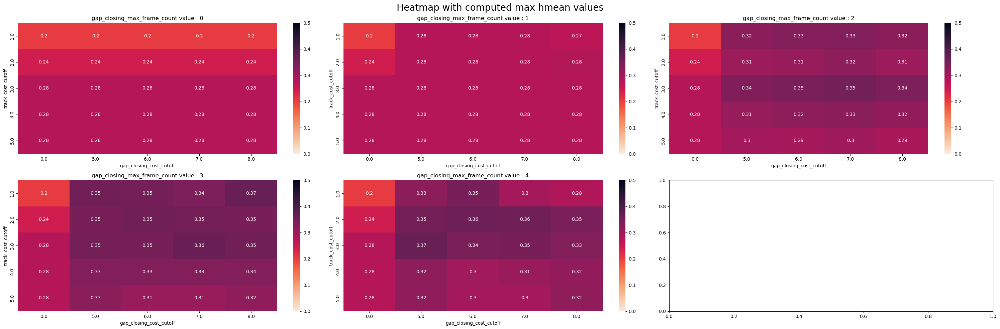

In [53]:
plot_heatmap2D(df_t,3,'max','hmean')

In [57]:
df_75_2.gap_closing_cost_cutoff.unique()

array([6., 5., 7., 8., 0.])

In [130]:
def check_filter(concentration,t,g,m):
    path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/75pM/dt_2/filtered_tracks/'
    fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
    
    df_b = df_75_2_b

    df_tracks_50_best = pd.DataFrame()
    counter = 0
    for file in os.listdir(path):
        if fil in file:
            df = pd.read_csv(os.path.join(path,file))
            df['seq'] = [counter]*len(df)
            df_tracks_50_best = pd.concat([df_tracks_50_best,df])
            counter +=1
    fig,ax = plt.subplots(figsize=(8,5))
    for i in range(1):
        df_filter = df_b[(df_b.seq == i) & (df_b.track_cost_cutoff == t) & (df_b.gap_closing_cost_cutoff == g) & (df_b.gap_closing_max_frame_count == m)]
        if df_filter.empty:
            l = [1000]
        else:
            l = df_filter.track_id1.unique()
        f = df_tracks_50_best[df_tracks_50_best.seq == i].copy(deep=True).groupby('track_id').size()
        f = pd.DataFrame(f)
        f['in?'] = f.index.isin(l)
        f.reset_index(drop=True,inplace=True)
        sns.histplot(data=f,x=0,hue='in?')
        fig.suptitle(f'concentration {concentration} pM \n track_cost_cutoff:{t} \n gap_closing_cost_cutoff:{g} \n gap_closing_max_frame_count:{m}')
        ax.set_xlabel('track length')
        plt.legend(['True','False'],title = 'Filtered \n tracks')
        # plt.ylim(0,10)
        fig.tight_layout()

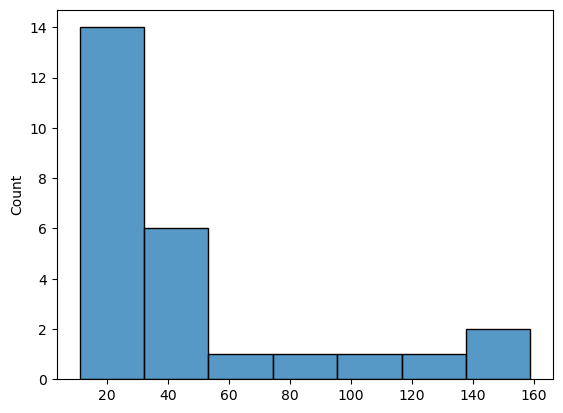

In [327]:
sns.histplot(data=df_gt_75.groupby('TRACK_ID').size())
plt.savefig('plots/GT_75.png')

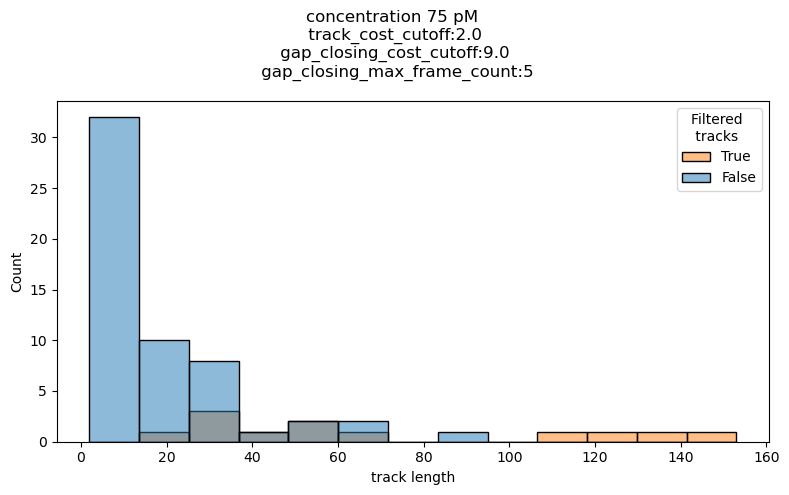

In [131]:
check_filter(75,2.0, 9.0, 5)

In [ ]:
# go check what the best parameter set gives as tracks

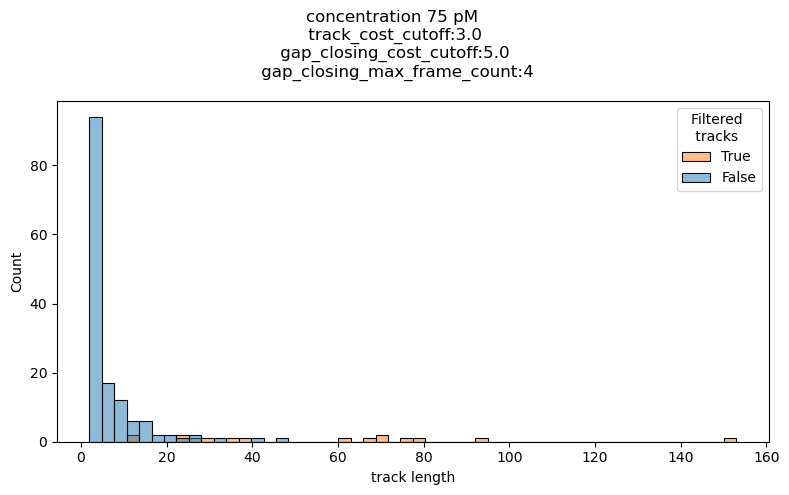

In [51]:
check_filter(75,3.0,5.0,4)

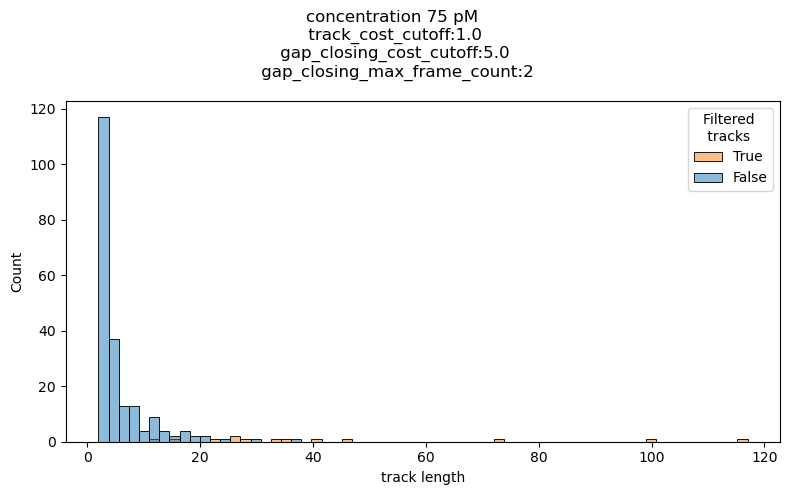

In [326]:
check_filter(75,1.0,5.0,2)
# plt.savefig('plots/filter_75_dt_2.png')

## finer search

In [4]:
df_75_2_finer = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/75pM/dt_2/filtered_tracks/evaluation/combined/combined_results.csv')

In [5]:
df_75_2_finer['iouw'] = df_75_2_finer['iou'] * df_75_2_finer['count']

In [6]:
df_75_2_finer_b = df_75_2_finer[df_75_2_finer['iouw'] > 10]

In [115]:
df_75_2_finer_b['hmean'] = (2 * (df_75_2_finer_b['iou'] * (df_75_2_finer_b['count']/195))) / (df_75_2_finer_b['iou'] + (df_75_2_finer_b['count']/195))

/scratch/louaness/ipykernel_170625/1493215862.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_75_2_finer_b['hmean'] = (2 * (df_75_2_finer_b['iou'] * (df_75_2_finer_b['count']/195))) / (df_75_2_finer_b['iou'] + (df_75_2_finer_b['count']/195))


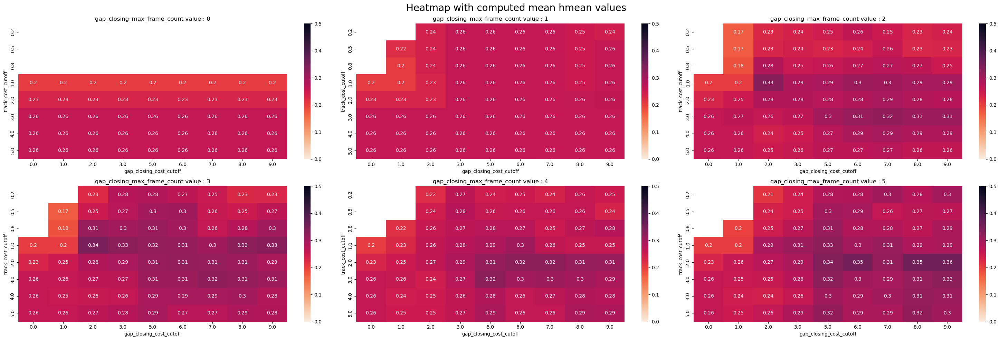

In [120]:
plot_heatmap2D(df_75_2_finer_b,3,'mean','hmean')

In [116]:
df_t = df_75_2_finer_b.copy(deep=True)

In [117]:
df_t = df_t.groupby(['track_cost_cutoff','gap_closing_cost_cutoff','gap_closing_max_frame_count']).mean()

In [118]:
df_t['hmean'] = (2 * (df_t['iou'] * (df_t['count']/195))) / (df_t['iou'] + (df_t['count']/195))

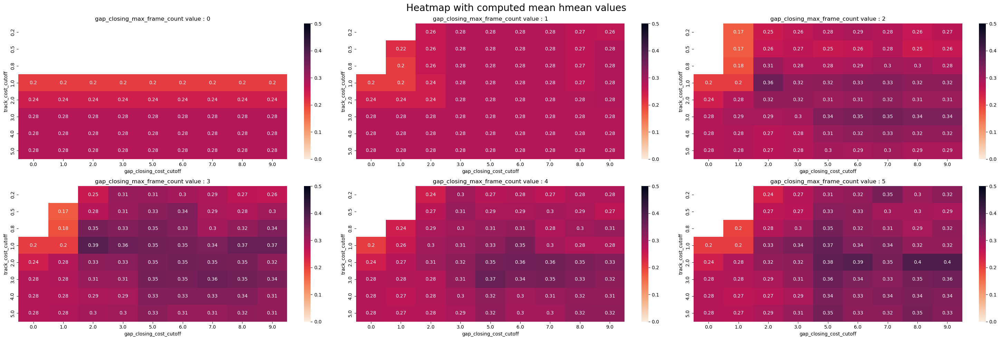

In [119]:
plot_heatmap2D(df_t,3,'mean','hmean')

<AxesSubplot: ylabel='Frequency'>

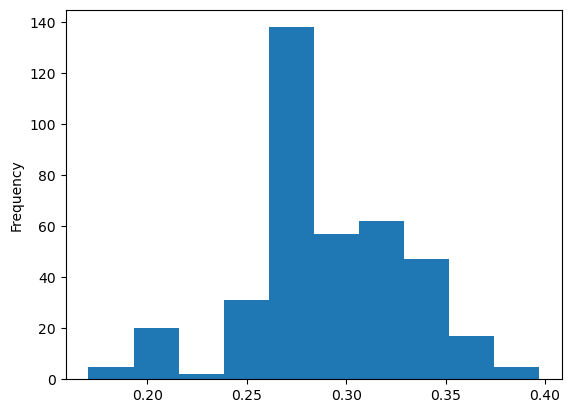

In [128]:
df_t.hmean.plot(kind='hist')

In [129]:
df_t[df_t.hmean > 0.36]

Unnamed: 0  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
1.0               2.0                     2                             63.500000   
                                          3                             36.909091   
                  3.0                     3                             31.000000   
                  5.0                     5                             21.333333   
                  8.0                     3                             38.416667   
                  9.0                     3                             41.666667   
2.0               5.0                     5                             21.200000   
                  6.0                     5                             21.333333   
                  8.0                     5                             20.666667   
                  9.0                     5                             24.916667   
3.0               5.0                     4                             21.125000   
                                          5                             21.631579   
                  7.0                     3                             23.357143   

                                                                        track_id1  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
1.0               2.0                     2                            315.875000   
                                          3                            223.363636   
                  3.0                     3                            160.375000   
                  5.0                     5                             42.933333   
                  8.0                     3                             60.666667   
                  9.0                     3                             52.500000   
2.0               5.0                     5                             68.050000   
                  6.0                     5                             52.111111   
                  8.0                     5                             23.416667   
                  9.0                     5                             22.666667   
3.0               5.0                     4                             80.125000   
                                          5                             74.421053   
                  7.0                     3                             65.142857   

                                                                       track_id2  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
1.0               2.0                     2                            90.875000   
                                          3                            67.363636   
                  3.0                     3                            77.875000   
                  5.0                     5                            52.400000   
                  8.0                     3                            67.583333   
                  9.0                     3                            67.583333   
2.0               5.0                     5                            68.350000   
                  6.0                     5                            66.833333   
                  8.0                     5                            85.750000   
                  9.0                     5                            76.666667   
3.0               5.0                     4                            58.750000   
                                          5                            73.947368   
                  7.0                     3                            67.928571   

                                                                           count  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
1.0               2.0                     2                            46.250000   
      

In [125]:
df_t[df_t.hmean == df_t['hmean'].max()]

,,,Unnamed: 0,track_id1,track_id2,count,iou,seq,iouw,hmean
track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,,,,,,,,
2.0,9.0,5,24.916667,22.666667,76.666667,53.916667,0.704655,0.0,37.422755,0.397154


In [131]:
df_t['ranking'] = df_t['hmean'].rank(method='first',ascending=False)
df_t = df_t.sort_values(by='ranking')

In [132]:
df_t

Unnamed: 0  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
2.0               9.0                     5                             24.916667   
                  8.0                     5                             20.666667   
                  6.0                     5                             21.333333   
1.0               2.0                     3                             36.909091   
2.0               5.0                     5                             21.200000   
...                                                                           ...   
0.8               1.0                     2                            111.500000   
                                          3                            109.000000   
0.2               1.0                     2                            219.000000   
0.5               1.0                     2                            218.000000   
                                          3                            222.000000   

                                                                        track_id1  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
2.0               9.0                     5                             22.666667   
                  8.0                     5                             23.416667   
                  6.0                     5                             52.111111   
1.0               2.0                     3                            223.363636   
2.0               5.0                     5                             68.050000   
...                                                                           ...   
0.8               1.0                     2                            482.000000   
                                          3                            445.500000   
0.2               1.0                     2                            981.000000   
0.5               1.0                     2                            970.000000   
                                          3                            888.000000   

                                                                        track_id2  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
2.0               9.0                     5                             76.666667   
                  8.0                     5                             85.750000   
                  6.0                     5                             66.833333   
1.0               2.0                     3                             67.363636   
2.0               5.0                     5                             68.350000   
...                                                                           ...   
0.8               1.0                     2                             88.500000   
                                          3                             88.500000   
0.2               1.0                     2                            174.000000   
0.5               1.0                     2                            174.000000   
                                          3                            174.000000   

                                                                           count  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
2.0               9.0                     5                            53.916667   
                  8.0                     5                            53.666667   
                  6.0                     5                            51.111111   
1.0               2.0                     3                            50.181818   
2.0               5.0                     5                            47.850000   
...                                                                          ...   
0.8               1.0                     2                            20.500000 

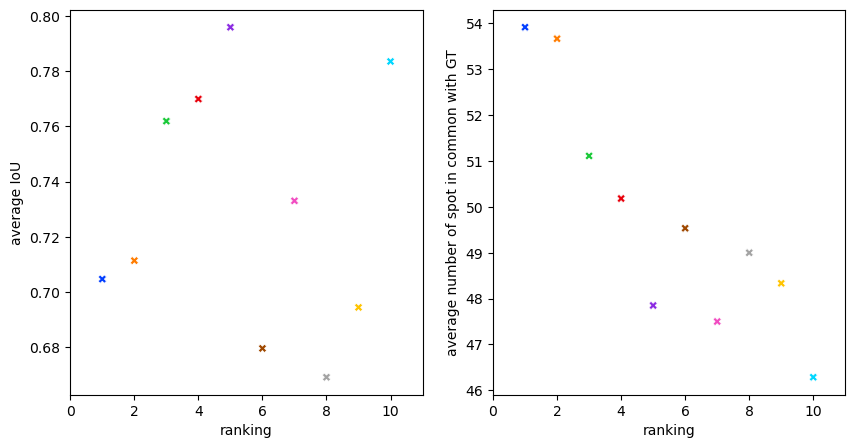

In [150]:
fig,ax = plt.subplots(1,2,figsize=(10,5))
sns.scatterplot(data=df_t[df_t.ranking < 11.0],x='ranking',y='iou',ax=ax[0],hue='ranking',palette='bright',legend=False,marker='X')
sns.scatterplot(data=df_t[df_t.ranking < 11.0],x='ranking',y='count',ax=ax[1],hue='ranking',palette='bright',legend=False,marker='X')
ax[0].set_ylabel('average IoU')
ax[1].set_ylabel('average number of spot in common with GT')
for a in ax:
    a.set_xlim(0,11)

In [151]:
df_t[df_t.ranking < 11.0]

Unnamed: 0  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
2.0               9.0                     5                             24.916667   
                  8.0                     5                             20.666667   
                  6.0                     5                             21.333333   
1.0               2.0                     3                             36.909091   
2.0               5.0                     5                             21.200000   
1.0               5.0                     5                             21.333333   
3.0               5.0                     4                             21.125000   
1.0               9.0                     3                             41.666667   
                  8.0                     3                             38.416667   
3.0               7.0                     3                             23.357143   

                                                                        track_id1  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
2.0               9.0                     5                             22.666667   
                  8.0                     5                             23.416667   
                  6.0                     5                             52.111111   
1.0               2.0                     3                            223.363636   
2.0               5.0                     5                             68.050000   
1.0               5.0                     5                             42.933333   
3.0               5.0                     4                             80.125000   
1.0               9.0                     3                             52.500000   
                  8.0                     3                             60.666667   
3.0               7.0                     3                             65.142857   

                                                                       track_id2  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
2.0               9.0                     5                            76.666667   
                  8.0                     5                            85.750000   
                  6.0                     5                            66.833333   
1.0               2.0                     3                            67.363636   
2.0               5.0                     5                            68.350000   
1.0               5.0                     5                            52.400000   
3.0               5.0                     4                            58.750000   
1.0               9.0                     3                            67.583333   
                  8.0                     3                            67.583333   
3.0               7.0                     3                            67.928571   

                                                                           count  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
2.0               9.0                     5                            53.916667   
                  8.0                     5                            53.666667   
                  6.0                     5                            51.111111   
1.0               2.0                     3                            50.181818   
2.0               5.0                     5                            47.850000   
1.0               5.0                     5                            49.533333   
3.0               5.0                     4                            47.500000   
1.0               9.0                     3                            49.000000   
                  8.0                     3                            48.333333   
3.0               7.0                     3                            46.285714   

           

In [156]:
df_75_2_b = df_t[df_t.ranking < 11.0]

In [7]:
df_75_2_b

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw
10,10,5,27,37,0.528571,0.8,8.0,4,0,19.557143
18,18,9,3,31,1.000000,0.8,8.0,4,0,31.000000
20,20,11,7,62,0.270742,0.8,8.0,4,0,16.786026
24,24,12,192,12,0.923077,0.8,8.0,4,0,11.076923
35,35,27,20,43,0.494253,0.8,8.0,4,0,21.252874
...,...,...,...,...,...,...,...,...,...,...
60832,82,247,7,46,0.275449,5.0,2.0,5,0,12.670659
60840,90,267,65,58,0.436090,5.0,2.0,5,0,25.293233
60841,91,272,129,19,0.527778,5.0,2.0,5,0,10.027778
60843,93,279,155,16,0.888889,5.0,2.0,5,0,14.222222


## compute hmean

### Compute longest strecth of tracks

### 50 dt2 test hmean

In [51]:
df_50_2 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/filtered_tracks/evaluation/combined/combined_results.csv')

In [52]:
df_50_2['iouw'] = df_50_2['iou'] * df_50_2['count']

In [53]:
df_50_2_b = df_50_2[df_50_2['iouw'] > 10]

In [54]:
df_50_2_b

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw
57,57,66,5,48,0.228571,1.0,10.0,3,0,10.971429
147,62,100,14,35,0.368421,5.0,6.0,6,0,12.894737
779,12,7,5,68,0.340000,1.0,12.0,7,0,23.120000
990,37,46,14,39,0.319672,5.0,7.0,6,0,12.467213
1259,16,10,14,36,0.281250,1.0,10.0,5,0,10.125000
...,...,...,...,...,...,...,...,...,...,...
45785,33,62,5,49,0.262032,3.0,5.0,7,0,12.839572
45983,28,18,14,36,0.297521,1.0,10.0,6,0,10.710744
46053,45,26,5,47,0.241026,3.0,10.0,7,0,11.328205
46340,36,66,5,61,0.301980,2.0,7.0,5,0,18.420792


In [55]:
df_50_2_b.reset_index(drop=True,inplace=True)

In [13]:
df = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/filtered_tracks/evaluation/track_cost_cutoff_1.0_gap_closing_cost_cutoff_0.0_gap_closing_max_frame_count_0_seq_0.csv')

In [14]:
df

,track_id1,track_id2,count,iou
0,8,29,2,0.090909
1,10,20,2,0.166667
2,23,5,2,0.011364
3,31,20,2,0.166667
4,50,20,3,0.250000
...,...,...,...,...
72,1057,5,1,0.005650
73,1077,5,2,0.011364
74,1085,5,3,0.017045
75,1101,5,6,0.034091


In [15]:
df_50_2_b

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw
0,57,66,5,48,0.228571,1.0,10.0,3,0,10.971429
1,62,100,14,35,0.368421,5.0,6.0,6,0,12.894737
2,12,7,5,68,0.340000,1.0,12.0,7,0,23.120000
3,37,46,14,39,0.319672,5.0,7.0,6,0,12.467213
4,16,10,14,36,0.281250,1.0,10.0,5,0,10.125000
...,...,...,...,...,...,...,...,...,...,...
158,33,62,5,49,0.262032,3.0,5.0,7,0,12.839572
159,28,18,14,36,0.297521,1.0,10.0,6,0,10.710744
160,45,26,5,47,0.241026,3.0,10.0,7,0,11.328205
161,36,66,5,61,0.301980,2.0,7.0,5,0,18.420792


In [13]:
n = []
for i in df_50_2_b.iloc:
    print(i)
    df = pd.read_csv(f'/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/filtered_tracks/track_cost_cutoff_{i.track_cost_cutoff}_gap_closing_cost_cutoff_{i.gap_closing_cost_cutoff}_gap_closing_max_frame_count_{int(i.gap_closing_max_frame_count)}_seq_0.csv')
    df = df[df.track_id == df_50_2_b.iloc[i.name].track_id1]
    df_50_2_b.loc[i.name,'most_consecutive_frames'] = get_most_consecutive_frames(df)
    n.append(get_most_consecutive_frames(df))
    print(n)
    break

Unnamed: 0                     57.000000
track_id1                      66.000000
track_id2                       5.000000
count                          48.000000
iou                             0.228571
track_cost_cutoff               1.000000
gap_closing_cost_cutoff        10.000000
gap_closing_max_frame_count     3.000000
seq                             0.000000
iouw                           10.971429
Name: 0, dtype: float64
[24]


/scratch/louaness/ipykernel_180508/351908164.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_50_2_b.loc[i.name,'most_consecutive_frames'] = get_most_consecutive_frames(df)


In [14]:
df_gt = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/filtered_tracks/gt_50pM_seq_0.csv')

In [15]:
df_gt[df_gt.track_id == 5]

,track_id,x,y,frame_real,frame
0,5,28.948370,26.771830,17,17
1,5,29.002097,23.783884,18,18
2,5,30.427048,26.778497,158,158
3,5,28.436562,25.434465,117,117
4,5,28.653868,25.919536,50,50
...,...,...,...,...,...
171,5,29.098501,25.856955,156,156
172,5,29.472140,25.691087,49,49
173,5,25.010246,26.652359,115,115
174,5,29.438359,25.039277,157,157


In [16]:
df.rename(columns={'x':'a'},inplace=True)
df.rename(columns={'y':'x'},inplace=True)
df.rename(columns={'a':'y'},inplace=True)

In [17]:
df_m = pd.merge(df_gt[df_gt.track_id == 5],df,on=['frame','x','y'])
df_m

,track_id_x,x,y,frame_real_x,frame,track_id_y,frame_real_y
0,5,30.427048,26.778497,158,158,66,158
1,5,29.490891,25.999634,162,162,66,162
2,5,29.524465,26.235614,163,163,66,163
3,5,30.099989,26.675498,164,164,66,164
4,5,29.930815,27.898532,165,165,66,165
5,5,29.706091,27.676292,166,166,66,166
6,5,29.489692,27.946070,167,167,66,167
7,5,29.544402,27.087047,168,168,66,168
8,5,29.854900,26.839237,169,169,66,169
9,5,30.302202,27.099153,171,171,66,171


In [18]:
consecutive_fams = [list(group) for group in consecutive_groups(df_m.frame.values)]
l = [len(i) for i in consecutive_fams]

In [21]:
df_m.frame.values

array([158, 162, 163, 164, 165, 166, 167, 168, 169, 171, 128, 129, 172,
       173, 131, 174, 175, 176, 177, 178, 179, 180, 136, 181, 182, 184,
       140, 185, 187, 188, 189, 144, 190, 191, 145, 192, 146, 193, 194,
       195, 196, 197, 198, 199, 150, 151, 153, 155])

In [ ]:
gaps = 3

In [23]:
consecutive_fams = sorted(df_m.frame.values)

In [ ]:
c_group = [[0]]
for i in consecutive_fams:
    if i - c_group[-1][-1] < gaps:
        c_group[-1].append(i)
    else:
        c_group.append([i])

NameError: name 'gaps' is not defined

In [26]:
max_len = max([len(i) for i in c_group])

In [27]:
# steps to compute longest strech of tracks

# for every tracks that are in the weighted iou > 10
# get the track id of the Gt and the exp
# open the dataframes
# get the number of gaps allowed
# rename the column x in y for the exp
# merge the two dataframes on frame and x and y to get the spots in common
# get all the stretches of consecutive frames
# depending on the gaps allowed, get the longest stretch



In [58]:
df_gt = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/filtered_tracks/gt_50pM_seq_0.csv')

for i in df_50_2_b.iloc:
    print(i)
    print(i.name)
    # get the track id of the Gt and the exp
    gt_id = i.track_id2
    exp_id = i.track_id1
    # open the dataframes
    df_exp = pd.read_csv(f'/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/filtered_tracks/track_cost_cutoff_{i.track_cost_cutoff}_gap_closing_cost_cutoff_{i.gap_closing_cost_cutoff}_gap_closing_max_frame_count_{int(i.gap_closing_max_frame_count)}_seq_{int(i.seq)}.csv')
    # get the number of gaps allowed
    n_gaps = int(i.gap_closing_max_frame_count)
    # rename the column x in y for the exp
    df_exp.rename(columns={'x':'a'},inplace=True)
    df_exp.rename(columns={'y':'x'},inplace=True)
    df_exp.rename(columns={'a':'y'},inplace=True)
    # merge the two dataframes on frame and x and y to get the spots in common
    df_m = pd.merge(df_gt[df_gt.track_id == gt_id],df_exp[df_exp.track_id == exp_id],on=['frame','x','y'])
    # get all the stretches of consecutive frames
    consecutive_fams = sorted(df_m.frame.values)
    # depending on the gaps allowed, get the longest stretch
    c_group = [[0]]
    for j in consecutive_fams:
        if j - c_group[-1][-1] < n_gaps:
            c_group[-1].append(j)
        else:
            c_group.append([j])

    longest_stretch = max([len(j) for j in c_group])

    df_50_2_b.loc[i.name,'most_consecutive_frames'] = longest_stretch

Unnamed: 0                     57.000000
track_id1                      66.000000
track_id2                       5.000000
count                          48.000000
iou                             0.228571
track_cost_cutoff               1.000000
gap_closing_cost_cutoff        10.000000
gap_closing_max_frame_count     3.000000
seq                             0.000000
iouw                           10.971429
Name: 0, dtype: float64
0
Unnamed: 0                      62.000000
track_id1                      100.000000
track_id2                       14.000000
count                           35.000000
iou                              0.368421
track_cost_cutoff                5.000000
gap_closing_cost_cutoff          6.000000
gap_closing_max_frame_count      6.000000
seq                              0.000000
iouw                            12.894737
most_consecutive_frames               NaN
Name: 1, dtype: float64
1
Unnamed: 0                     12.00
track_id1                       7.00
tr

/scratch/louaness/ipykernel_180508/339697991.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_50_2_b.loc[i.name,'most_consecutive_frames'] = longest_stretch


Unnamed: 0                     48.000000
track_id1                      57.000000
track_id2                       5.000000
count                          52.000000
iou                             0.245283
track_cost_cutoff               5.000000
gap_closing_cost_cutoff         9.000000
gap_closing_max_frame_count     5.000000
seq                             0.000000
iouw                           12.754717
most_consecutive_frames              NaN
Name: 10, dtype: float64
10
Unnamed: 0                     36.000000
track_id1                      42.000000
track_id2                      14.000000
count                          38.000000
iou                             0.391753
track_cost_cutoff               2.000000
gap_closing_cost_cutoff        10.000000
gap_closing_max_frame_count     4.000000
seq                             0.000000
iouw                           14.886598
most_consecutive_frames              NaN
Name: 11, dtype: float64
11
Unnamed: 0                      66.000000


In [59]:
df_50_2_b

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw,most_consecutive_frames
0,57,66,5,48,0.228571,1.0,10.0,3,0,10.971429,35.0
1,62,100,14,35,0.368421,5.0,6.0,6,0,12.894737,16.0
2,12,7,5,68,0.340000,1.0,12.0,7,0,23.120000,16.0
3,37,46,14,39,0.319672,5.0,7.0,6,0,12.467213,16.0
4,16,10,14,36,0.281250,1.0,10.0,5,0,10.125000,22.0
...,...,...,...,...,...,...,...,...,...,...,...
158,33,62,5,49,0.262032,3.0,5.0,7,0,12.839572,19.0
159,28,18,14,36,0.297521,1.0,10.0,6,0,10.710744,19.0
160,45,26,5,47,0.241026,3.0,10.0,7,0,11.328205,28.0
161,36,66,5,61,0.301980,2.0,7.0,5,0,18.420792,27.0


In [61]:
df_50_2_b_h = compute_hmean(df_50_2_b,1000)

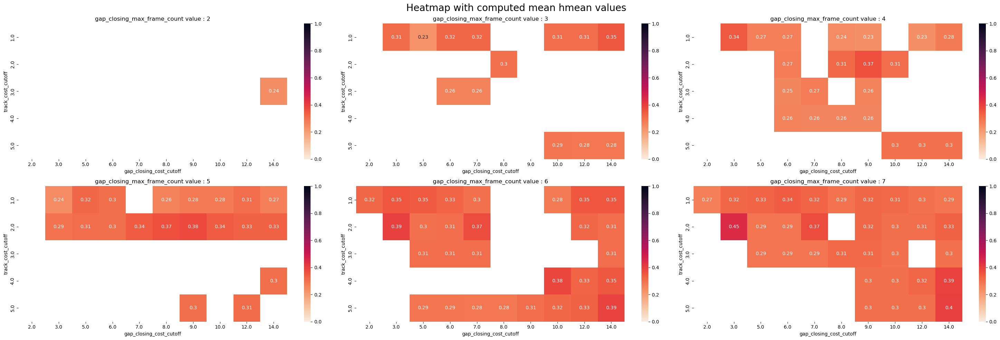

In [62]:
plot_heatmap2D(df_50_2_b_h,3,'mean','hmean')

In [19]:
df_50_2_b_h

Unnamed: 0  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
5.0               14.0                    7                                  37.0   
2.0               9.0                     4                                  41.0   
4.0               14.0                    7                                  18.0   
1.0               7.0                     3                                  10.0   
                  12.0                    6                                  36.0   
...                                                                           ...   
5.0               14.0                    4                                  15.0   
1.0               5.0                     3                                  40.0   
                  10.0                    6                                  28.0   
3.0               14.0                    7                                  54.0   
1.0               2.0                     7                                  44.0   

                                                                       track_id1  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
5.0               14.0                    7                                 12.0   
2.0               9.0                     4                                 54.0   
4.0               14.0                    7                                  7.0   
1.0               7.0                     3                                 13.0   
                  12.0                    6                                 16.0   
...                                                                          ...   
5.0               14.0                    4                                  7.0   
1.0               5.0                     3                                104.0   
                  10.0                    6                                 18.0   
3.0               14.0                    7                                 22.0   
1.0               2.0                     7                                206.0   

                                                                       track_id2  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
5.0               14.0                    7                                  5.0   
2.0               9.0                     4                                 14.0   
4.0               14.0                    7                                  5.0   
1.0               7.0                     3                                  5.0   
                  12.0                    6                                  5.0   
...                                                                          ...   
5.0               14.0                    4                                  5.0   
1.0               5.0                     3                                  5.0   
                  10.0                    6                                 14.0   
3.0               14.0                    7                                 14.0   
1.0               2.0                     7                                 14.0   

                                                                       count  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count          
5.0               14.0                    7                             86.0   
2.0               9.0                     4                             61.0   
4.0               14.0                    7                             81.0   
1.0               7.0                     3                             78.0   
                  12.0                    6                             78.0   
...                                                                      ...   
5.0               14.0                    4                             44.0   
1.0               5.0                     3                

,Unnamed: 0,track_id1,track_id2,count,iou,track_cost_cutoff,gap_closing_cost_cutoff,gap_closing_max_frame_count,seq,iouw,most_consecutive_frames
0,10,5,27,37,0.528571,0.8,8.0,4,0,19.557143,23.0
1,18,9,3,31,1.000000,0.8,8.0,4,0,31.000000,27.0
2,20,11,7,62,0.270742,0.8,8.0,4,0,16.786026,32.0
3,24,12,192,12,0.923077,0.8,8.0,4,0,11.076923,4.0
4,35,27,20,43,0.494253,0.8,8.0,4,0,21.252874,7.0
...,...,...,...,...,...,...,...,...,...,...,...
3736,82,247,7,46,0.275449,5.0,2.0,5,0,12.670659,34.0
3737,90,267,65,58,0.436090,5.0,2.0,5,0,25.293233,55.0
3738,91,272,129,19,0.527778,5.0,2.0,5,0,10.027778,13.0
3739,93,279,155,16,0.888889,5.0,2.0,5,0,14.222222,10.0


# 100 pM dt 2

In [22]:
df_100_2 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/large_sweep/evaluation/combined/combined_results.csv')

In [23]:
df_100_2['iouw'] = df_100_2['iou'] * df_100_2['count']

<AxesSubplot: >

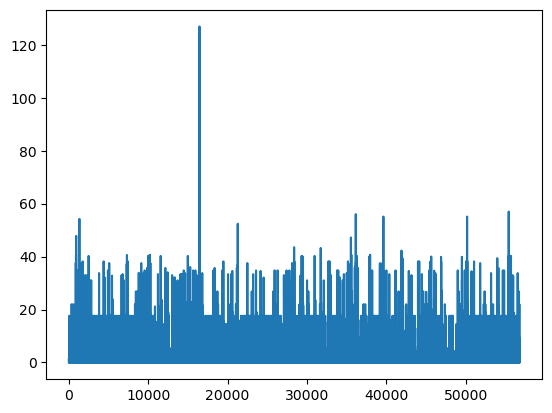

In [24]:
df_100_2['iouw'].plot()

In [25]:
df_100_2_b = df_100_2[df_100_2['iouw'] > 10]

In [26]:
df_100_2_b.reset_index(drop=True,inplace=True)

In [27]:
def add_consecutive_frame(df_50_2_b,concentration,dt,sweep):
    for i in df_50_2_b.iloc:
        df = pd.read_csv(f'/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/{concentration}pM/dt_{dt}/{sweep}/track_cost_cutoff_{i.track_cost_cutoff}_gap_closing_cost_cutoff_{i.gap_closing_cost_cutoff}_gap_closing_max_frame_count_{int(i.gap_closing_max_frame_count)}_seq_0.csv')
        df = df[df.track_id == df_50_2_b.iloc[i.name].track_id1]
        df_50_2_b.loc[i.name,'most_consecutive_frames'] = get_most_consecutive_frames(df)
    return df_50_2_b

In [28]:
df_100_2_b = add_consecutive_frame(df_100_2_b,100,2,'large_sweep')

/scratch/louaness/ipykernel_69797/2601324903.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_50_2_b.loc[i.name,'most_consecutive_frames'] = get_most_consecutive_frames(df)


In [29]:
df_100 = compute_hmean(df_100_2_b,1000)

In [30]:
df_100

Unnamed: 0  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
3.0               1.5                     2                             26.000000   
                  2.0                     2                             25.000000   
2.5               1.5                     2                             28.000000   
                  2.0                     2                             27.000000   
1.5               1.5                     2                             36.000000   
...                                                                           ...   
2.5               2.0                     4                             68.714286   
2.2               2.5                     4                             54.222222   
2.0               1.5                     4                             68.571429   
2.2               1.5                     4                             68.142857   
                  2.0                     4                             62.000000   

                                                                        track_id1  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
3.0               1.5                     2                             48.000000   
                  2.0                     2                             46.000000   
2.5               1.5                     2                             52.000000   
                  2.0                     2                             50.000000   
1.5               1.5                     2                             76.000000   
...                                                                           ...   
2.5               2.0                     4                            146.000000   
2.2               2.5                     4                            114.222222   
2.0               1.5                     4                            171.285714   
2.2               1.5                     4                            167.000000   
                  2.0                     4                            141.875000   

                                                                        track_id2  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
3.0               1.5                     2                            137.000000   
                  2.0                     2                            137.000000   
2.5               1.5                     2                            137.000000   
                  2.0                     2                            137.000000   
1.5               1.5                     2                            137.000000   
...                                                                           ...   
2.5               2.0                     4                            115.714286   
2.2               2.5                     4                            115.000000   
2.0               1.5                     4                            115.714286   
2.2               1.5                     4                            115.714286   
                  2.0                     4                            102.125000   

                                                                           count  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
3.0               1.5                     2                            76.000000   
                  2.0                     2                            76.000000   
2.5               1.5                     2                            76.000000   
                  2.0                     2                            76.000000   
1.5               1.5                     2                            72.000000   
...                                                                          ...   
2.5               2.0                     4                            39.714286 

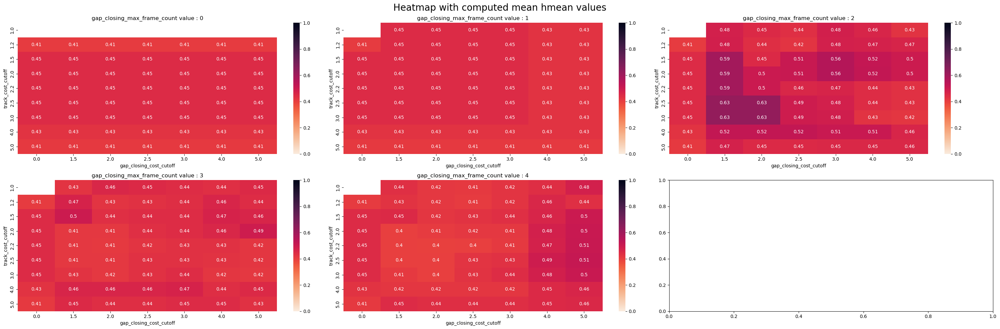

In [119]:
plot_heatmap2D(df_100,3,'mean','hmean')

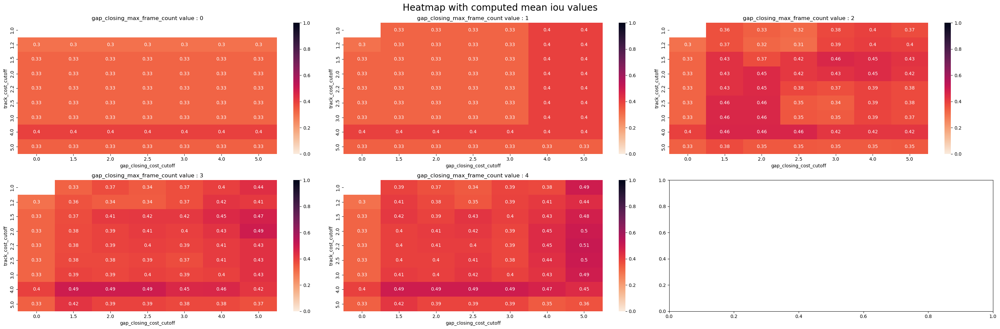

In [120]:
plot_heatmap2D(df_100_2_b,3,'mean','iou')

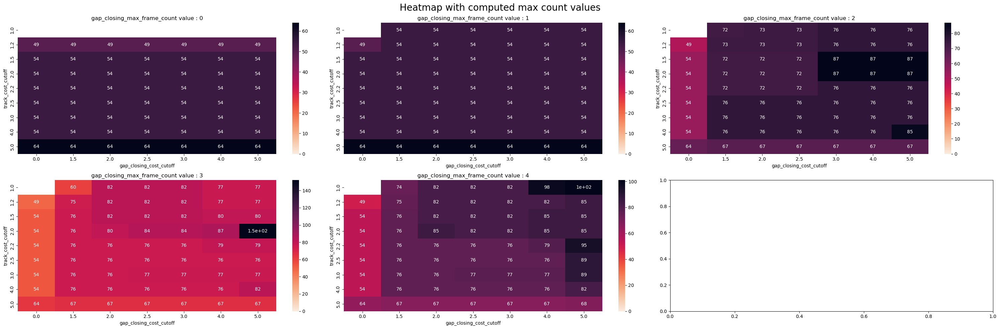

In [234]:
plot_heatmap2D(df_100_2_b,3,'max','count')

### 75pM dt2 hmean

In [31]:
df_75_2_finer_b.reset_index(drop=True,inplace=True)

In [32]:
df_75_2_finer_b = add_consecutive_frame(df_75_2_finer_b,75,2,'filtered_tracks')

/scratch/louaness/ipykernel_69797/2601324903.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_50_2_b.loc[i.name,'most_consecutive_frames'] = get_most_consecutive_frames(df)


In [33]:
df_75_2_finer_b_h = compute_hmean(df_75_2_finer_b,1000)

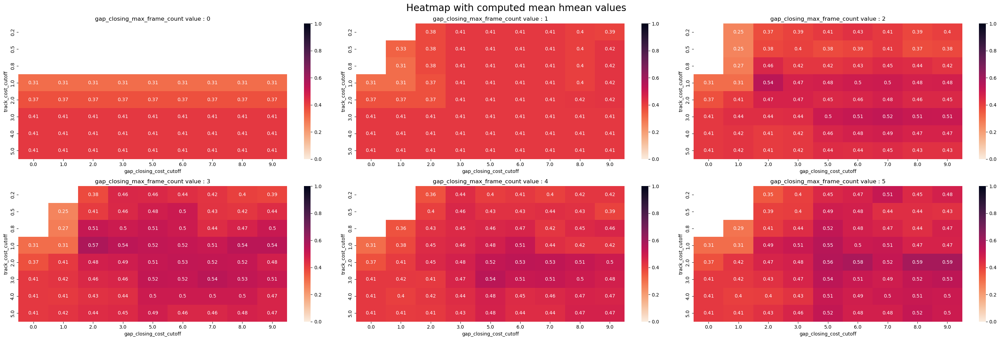

In [127]:
plot_heatmap2D(df_75_2_finer_b_h,3,'mean','hmean')

In [34]:
df_75_2_finer_b_h

Unnamed: 0  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
2.0               9.0                     5                             24.916667   
                  8.0                     5                             20.666667   
                  6.0                     5                             21.333333   
1.0               2.0                     3                             36.909091   
2.0               5.0                     5                             21.200000   
...                                                                           ...   
0.8               1.0                     2                            111.500000   
                                          3                            109.000000   
0.2               1.0                     2                            219.000000   
0.5               1.0                     2                            218.000000   
                                          3                            222.000000   

                                                                        track_id1  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
2.0               9.0                     5                             22.666667   
                  8.0                     5                             23.416667   
                  6.0                     5                             52.111111   
1.0               2.0                     3                            223.363636   
2.0               5.0                     5                             68.050000   
...                                                                           ...   
0.8               1.0                     2                            482.000000   
                                          3                            445.500000   
0.2               1.0                     2                            981.000000   
0.5               1.0                     2                            970.000000   
                                          3                            888.000000   

                                                                        track_id2  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count               
2.0               9.0                     5                             76.666667   
                  8.0                     5                             85.750000   
                  6.0                     5                             66.833333   
1.0               2.0                     3                             67.363636   
2.0               5.0                     5                             68.350000   
...                                                                           ...   
0.8               1.0                     2                             88.500000   
                                          3                             88.500000   
0.2               1.0                     2                            174.000000   
0.5               1.0                     2                            174.000000   
                                          3                            174.000000   

                                                                           count  \
track_cost_cutoff gap_closing_cost_cutoff gap_closing_max_frame_count              
2.0               9.0                     5                            53.916667   
                  8.0                     5                            53.666667   
                  6.0                     5                            51.111111   
1.0               2.0                     3                            50.181818   
2.0               5.0                     5                            47.850000   
...                                                                          ...   
0.8               1.0                     2                            20.500000 

In [129]:
df_75_2_finer_b_h.index[0]

(2.0, 9.0, 5)

In [277]:
def check_filter(concentration,t,g,m):
    path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_2/large_sweep/'
    fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
    df_b = df_100_2_b

    df_tracks_50_best = pd.DataFrame()
    counter = 0
    for file in os.listdir(path):
        if fil in file:
            df = pd.read_csv(os.path.join(path,file))
            df['seq'] = [counter]*len(df)
            df_tracks_50_best = pd.concat([df_tracks_50_best,df])
            counter +=1
    fig,ax = plt.subplots(figsize=(8,5))
    for i in range(1):
        df_filter = df_b[(df_b.seq == i) & (df_b.track_cost_cutoff == t) & (df_b.gap_closing_cost_cutoff == g) & (df_b.gap_closing_max_frame_count == m)]
        if df_filter.empty:
            l = [1000]
        else:
            l = df_filter.track_id1.unique()
        f = df_tracks_50_best[df_tracks_50_best.seq == i].copy(deep=True).groupby('track_id').size()
        f = pd.DataFrame(f)
        f['in?'] = f.index.isin(l)
        f.reset_index(drop=True,inplace=True)
        sns.histplot(data=f,x=0,hue='in?')
        fig.suptitle(f'concentration {concentration} pM \n track_cost_cutoff:{t} \n gap_closing_cost_cutoff:{g} \n gap_closing_max_frame_count:{m}')
        ax.set_xlabel('track length')
        # plt.ylim(0,10)
        fig.tight_layout()

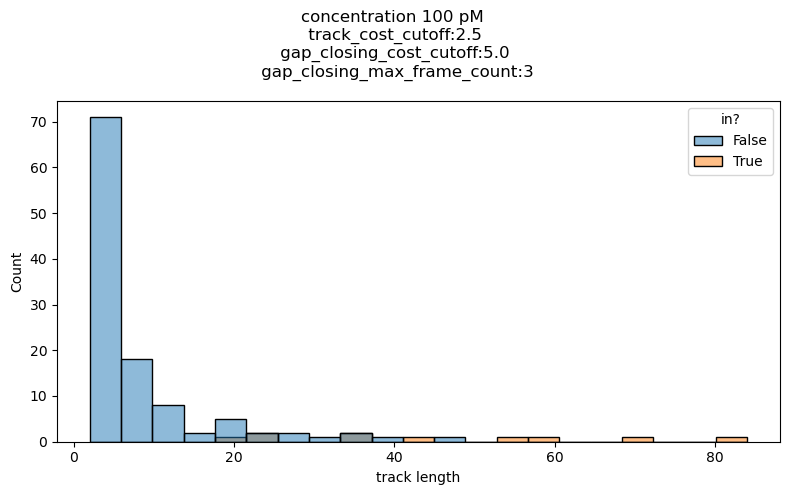

In [279]:
check_filter(100,2.5,5.0,3)
plt.savefig('plots/filter_100_dt_2.png')

# 50pM dt 4

In [5]:
df_50_4 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_4/first_sweep/evaluation/combined/combined_results.csv')

In [330]:
df_50_4['iouw'] = df_50_4['iou'] * df_50_4['count']

(0.0, 5.0)

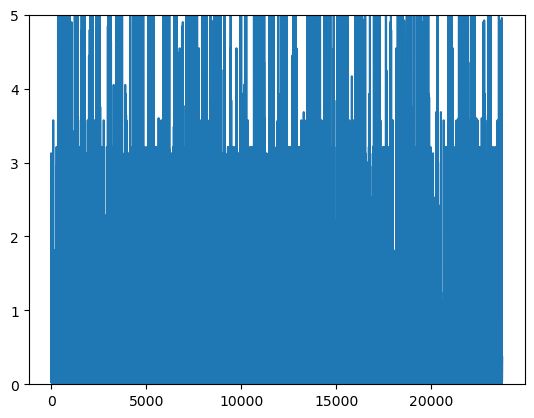

In [335]:
df_50_4['iouw'].plot()
plt.ylim(0,5)

In [336]:
df_50_4_b = df_50_4[df_50_4['iouw'] > 3]

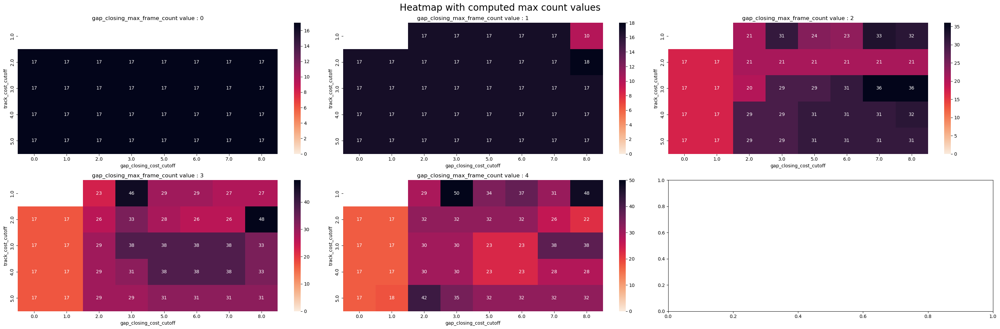

In [350]:
plot_heatmap2D(df_50_4_b,3,'max','count')

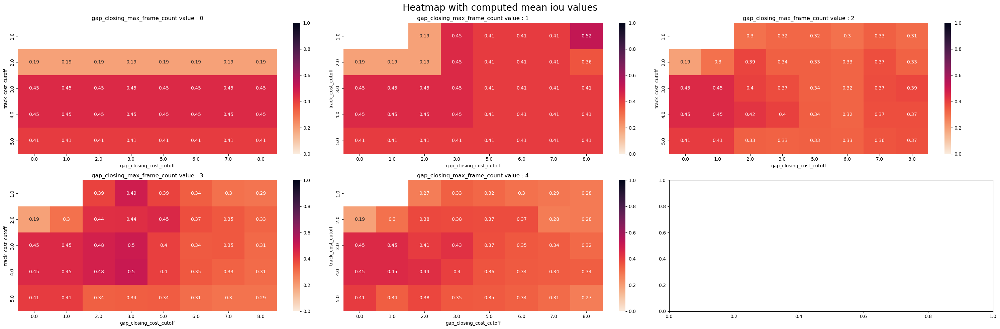

In [342]:
plot_heatmap2D(df_50_4_b,3,'mean','iou')

In [470]:
def check_filter(concentration,t,g,m):
    path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_4/filtered_tracks/'
    fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
    df_b = df_50_4_b

    df_tracks_50_best = pd.DataFrame()
    counter = 0
    for file in os.listdir(path):
        if fil in file:
            df = pd.read_csv(os.path.join(path,file))
            df['seq'] = [nfs.get_nums(os.path.join(path,file))[-1]]*len(df)
            df_tracks_50_best = pd.concat([df_tracks_50_best,df])
            counter +=1
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    ax = ax.ravel()
    for i in range(2):
        df_filter = df_b[(df_b.seq == i) & (df_b.track_cost_cutoff == t) & (df_b.gap_closing_cost_cutoff == g) & (df_b.gap_closing_max_frame_count == m)]
        if df_filter.empty:
            l = [1000]
        else:
            l = list(df_filter.track_id1.unique())
        f = df_tracks_50_best[df_tracks_50_best.seq == i].groupby('track_id').size()
        f = pd.DataFrame(f)
        f['in?'] = f.index.isin(l)
        # f.reset_index(drop=True,inplace=True)
        sns.histplot(data=f,x=0,hue='in?',ax=ax[i])
        fig.suptitle(f'concentration {concentration} pM \n track_cost_cutoff:{t} \n gap_closing_cost_cutoff:{g} \n gap_closing_max_frame_count:{m}')
        ax[i].set_xlabel('track length')
    fig.tight_layout()
    return f

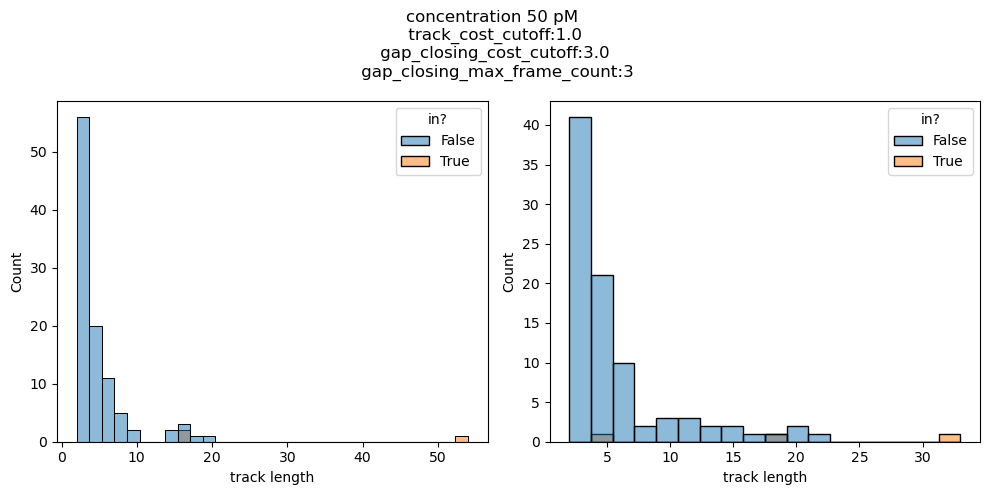

In [471]:
f = check_filter(50,1.0,3.0,3)

# 75 pM dt 4

In [496]:
df_75_4 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/75pM/dt_4/filtered_tracks/evaluation/combined/combined_results.csv')

In [498]:
df_75_4['iouw'] = df_75_4['iou'] * df_75_4['count']

<AxesSubplot: >

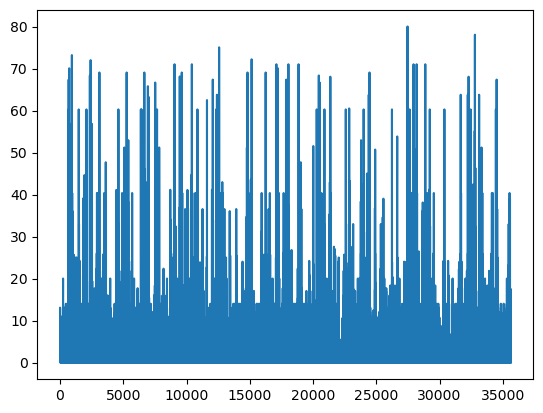

In [499]:
df_75_4.iouw.plot()

In [500]:
df_75_4_b = df_75_4[df_75_4['iouw'] > 3]

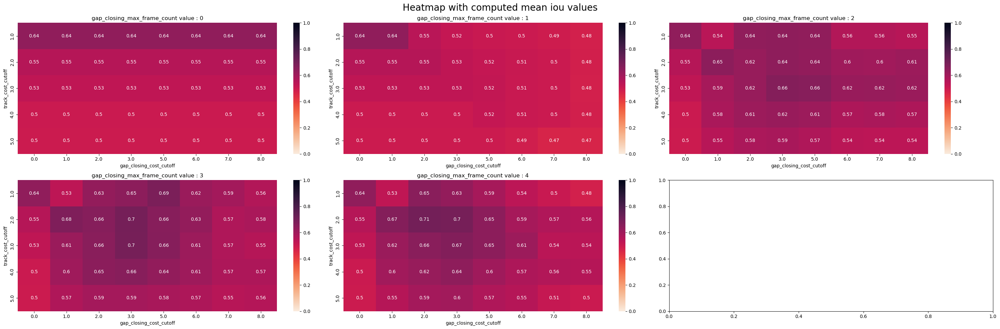

In [502]:
plot_heatmap2D(df_75_4_b,3,'mean','iou')

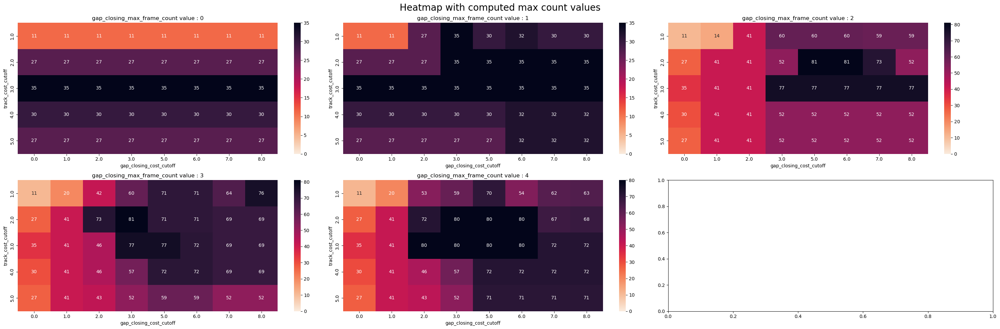

In [501]:
plot_heatmap2D(df_75_4_b,3,'max','count')

In [505]:
def check_filter(concentration,t,g,m):
    path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/75pM/dt_4/filtered_tracks/'
    fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
    df_b = df_75_4_b

    df_tracks_50_best = pd.DataFrame()
    counter = 0
    for file in os.listdir(path):
        if fil in file:
            df = pd.read_csv(os.path.join(path,file))
            df['seq'] = [nfs.get_nums(os.path.join(path,file))[-1]]*len(df)
            df_tracks_50_best = pd.concat([df_tracks_50_best,df])
            counter +=1
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    ax = ax.ravel()
    for i in range(2):
        df_filter = df_b[(df_b.seq == i) & (df_b.track_cost_cutoff == t) & (df_b.gap_closing_cost_cutoff == g) & (df_b.gap_closing_max_frame_count == m)]
        if df_filter.empty:
            l = [1000]
        else:
            l = list(df_filter.track_id1.unique())
        f = df_tracks_50_best[df_tracks_50_best.seq == i].groupby('track_id').size()
        f = pd.DataFrame(f)
        f['in?'] = f.index.isin(l)
        # f.reset_index(drop=True,inplace=True)
        sns.histplot(data=f,x=0,hue='in?',ax=ax[i])
        fig.suptitle(f'concentration {concentration} pM \n track_cost_cutoff:{t} \n gap_closing_cost_cutoff:{g} \n gap_closing_max_frame_count:{m}')
        ax[i].set_xlabel('track length')
    fig.tight_layout()

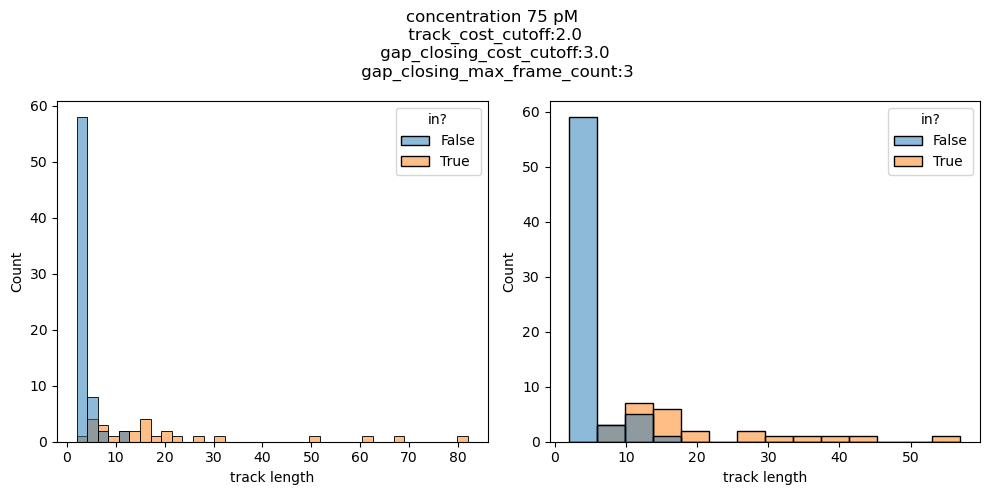

In [506]:
check_filter(75,2.0,3.0,3)

# 100 pM dt 4

In [507]:
df_100_4 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_4/filtered_tracks/evaluation/combined/combined_results.csv')

In [508]:
df_100_4['iouw'] = df_100_4['iou'] * df_100_4['count']

<AxesSubplot: >

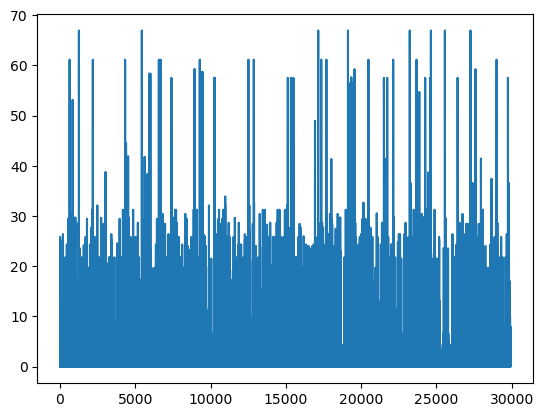

In [509]:
df_100_4.iouw.plot()

In [510]:
df_100_4_b = df_100_4[df_100_4['iouw'] > 3]

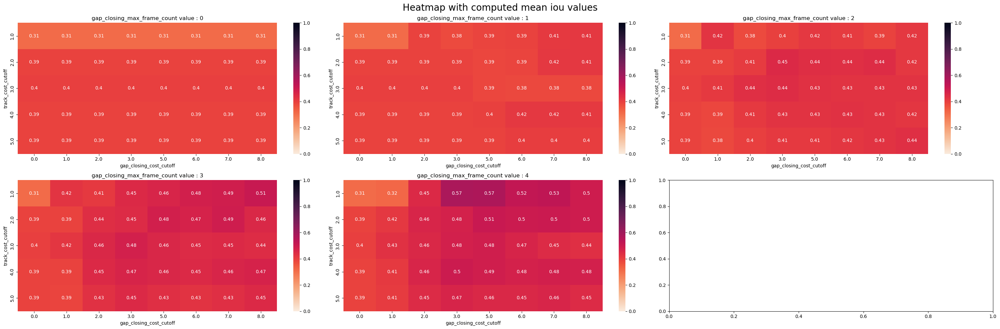

In [511]:
plot_heatmap2D(df_100_4_b,3,'mean','iou')

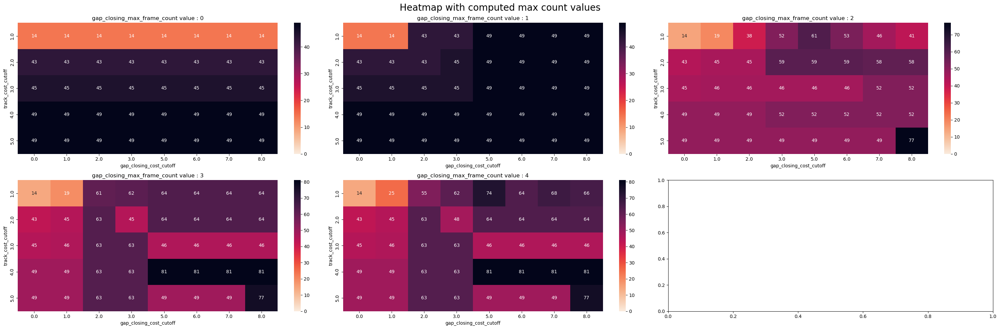

In [512]:
plot_heatmap2D(df_100_4_b,3,'max','count')

In [513]:
def check_filter(concentration,t,g,m):
    path = '/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/100pM/dt_4/filtered_tracks/'
    fil = f'track_cost_cutoff_{t}_gap_closing_cost_cutoff_{g}_gap_closing_max_frame_count_{m}'
    df_b = df_100_4_b

    df_tracks_50_best = pd.DataFrame()
    counter = 0
    for file in os.listdir(path):
        if fil in file:
            df = pd.read_csv(os.path.join(path,file))
            df['seq'] = [nfs.get_nums(os.path.join(path,file))[-1]]*len(df)
            df_tracks_50_best = pd.concat([df_tracks_50_best,df])
            counter +=1
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    ax = ax.ravel()
    for i in range(2):
        df_filter = df_b[(df_b.seq == i) & (df_b.track_cost_cutoff == t) & (df_b.gap_closing_cost_cutoff == g) & (df_b.gap_closing_max_frame_count == m)]
        if df_filter.empty:
            l = [1000]
        else:
            l = list(df_filter.track_id1.unique())
        f = df_tracks_50_best[df_tracks_50_best.seq == i].groupby('track_id').size()
        f = pd.DataFrame(f)
        f['in?'] = f.index.isin(l)
        # f.reset_index(drop=True,inplace=True)
        sns.histplot(data=f,x=0,hue='in?',ax=ax[i])
        fig.suptitle(f'concentration {concentration} pM \n track_cost_cutoff:{t} \n gap_closing_cost_cutoff:{g} \n gap_closing_max_frame_count:{m}')
        ax[i].set_xlabel('track length')
    fig.tight_layout()

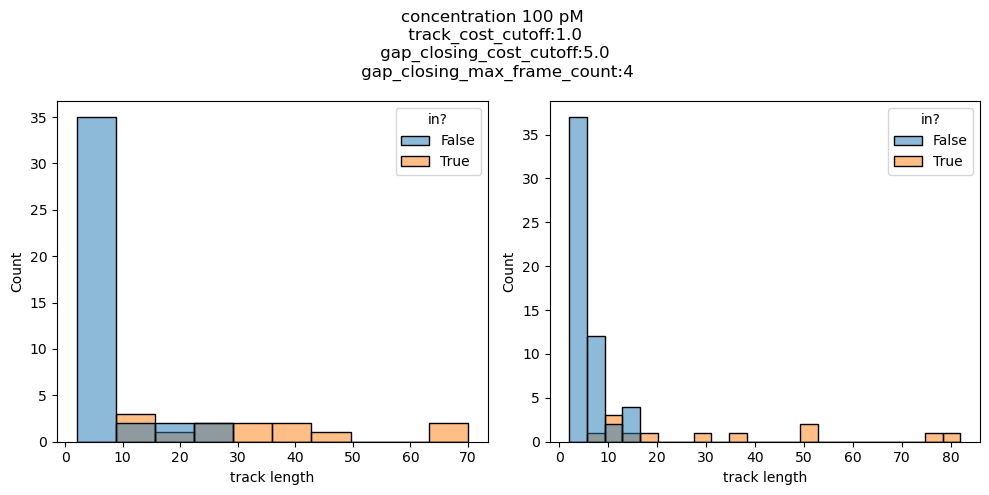

In [514]:
check_filter(100,1.0,5.0,4)

In [517]:
df_50_4_b.to_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/final_dataframes/df_50_4_b.csv')

## Test if adding the 3d dimention works better

In [8]:
import tifffile as tif

In [9]:
im = tif.imread('/tungstenfs/scratch/ggiorget/nessim/tracking/ground_truth/50pM/20230328_Rad21-Halo_SPT_1C5_NIPBL_LP4_40mW_50pM_30min_1_w1FullseqTIRF-Cy5-mCherryGFPWithSMB_w1_crop.tif')

In [10]:
df_detection_50 = pd.read_csv('/tungstenfs/scratch/ggiorget/nessim/snakemake/benchmark_tracking/results/50pM/dt_2/test_lap_code/exp_50pM_seq_0.csv')

In [11]:
df_detection_50

,x,y,sd_fit_x,sd_fit_y,frame_real,frame
0,7.562998,8.776799,0.095759,0.084658,0,0
1,21.941932,15.953177,0.128775,0.127675,0,0
2,18.615327,28.017595,0.111742,0.086728,0,0
3,31.557837,21.443455,0.353170,0.382384,0,0
4,6.806359,19.941969,0.125179,0.113492,0,0
...,...,...,...,...,...,...
1376,16.046190,27.796482,0.119426,0.141809,198,198
1377,27.981899,31.347527,0.313045,0.238566,199,199
1378,5.600774,21.762651,0.072050,0.066162,199,199
1379,18.113235,31.290062,0.273801,0.240520,199,199


In [16]:
z = []
for i in df_detection_50.iloc:
    print(np.where(im[int(i.frame),:,int(i.y),int(i.x)] == np.max(im[i.frame,:,int(i.y),int(i.x)]))[0][0])
    z.append(np.where(im[int(i.frame),:,int(i.y),int(i.x)] == np.max(im[i.frame,:,int(i.y),int(i.x)]))[0][0])
    print(z)
    break

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [22]:
y = df_detection_50.x.values.astype(int)
x = df_detection_50.y.values.astype(int)

In [23]:
z_loc = [np.where(im[frame,:,y[i],x[i]]==np.max(im[frame,:,y[i],x[i]]))[0][0]  for frame,i in zip(range(200),range(len(x)))]#find where the intensity is max in z at everz x y detected

In [26]:
df_detection_50['z'] = z_loc

ValueError: Length of values (200) does not match length of index (1381)